<a href="https://colab.research.google.com/github/JiedanX/SpatialTranscriptomic/blob/main/MEKO_Thesis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MEKO:  Digital KOS with GenKI using DBiT-seq mouse embryo dataset

## GenKI tutorial

Use the tutorial dataset to get examples of the skewness and kurtosis


In [ ]:
# Install GenKI and torch_geometric as a prerequisite
! pip install git+https://github.com/yjgeno/GenKI.git
! pip install torch_geometric

# Install STRINGdb and Networkx for network biology models
! pip install stringdb
! pip install networkx pandas

  Cloning https://github.com/yjgeno/GenKI.git to /tmp/pip-req-build-3sqo8f_q
  Running command git clone --filter=blob:none --quiet https://github.com/yjgeno/GenKI.git /tmp/pip-req-build-3sqo8f_q
  Resolved https://github.com/yjgeno/GenKI.git to commit 6d69789b89859eda75ac75dfb1cc00ef190ada41
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.3/57.3 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.1/96.1 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 18.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.9/11.9 MB 56.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 54.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 MB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 MB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 43.5 MB/s eta 0:00

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.2/64.2 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 23.2 MB/s eta 0:00:00


In [ ]:
# Restart kernel
import os
os.kill(os.getpid(), 9)

In [ ]:
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc

sc.settings.verbosity = 0

In [ ]:
import GenKI as gk
from GenKI.preprocesing import build_adata
from GenKI.dataLoader import DataLoader
from GenKI.train import VGAE_trainer
from GenKI import utils

%load_ext autoreload
%autoreload 2

In [ ]:
# Import STRINGdb for PPI network models and Networkx for visualisation and potential graph analysis
import stringdb
import networkx as nx

In [ ]:
# Download the GenKI demo adata object about microglia
!gdown  1PRsaaDUk8qFBpwUDhxSwRWmSAv6aajSU

# https://doi.org/10.1016/j.neuron.2019.12.007

Downloading...
From (original): https://drive.google.com/uc?id=1PRsaaDUk8qFBpwUDhxSwRWmSAv6aajSU
From (redirected): https://drive.google.com/uc?id=1PRsaaDUk8qFBpwUDhxSwRWmSAv6aajSU&confirm=t&uuid=30e1d9cf-7ff3-4862-9a98-87dbc2d5bb8e
To: /content/microglial_seurat_WT.h5ad
100% 124M/124M [00:02<00:00, 54.3MB/s]


In [ ]:
# subset data as an example
adata = build_adata("microglial_seurat_WT.h5ad")
adata = adata[:100, :300].copy()
adata

load counts from microglial_seurat_WT.h5ad


AnnData object with n_obs × n_vars = 100 × 300
    obs: 'sce_source', 'treatment', 'trem2_genotype', 'snn_cluster', 'nCount_RNA', 'nFeature_RNA'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    layers: 'norm'

In [ ]:
# Assemble the data_wrapper which controls aspects of the digital KO experimen
data_wrapper =  DataLoader(
                adata, # adata object
                target_gene = ["TUBG1"], # KO gene name
                target_cell = None, # obsname for cell type, if none use all
                obs_label = "ident", # colname for genes
                GRN_file_dir = "GRNs", # folder name for GRNs
                rebuild_GRN = True, # whether build GRN by pcNet
                pcNet_name = "pcNet_example", # GRN file name
                verbose = True, # whether verbose
                n_cpus = 8, # multiprocessing
                )

data_wt = data_wrapper.load_data()
data_ko = data_wrapper.load_kodata()

use all the cells (100) in adata
build GRN


/usr/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(
/usr/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(
2024-08-11 11:03:00,803	INFO worker.py:1781 -- Started a local Ray instance.


ray init, using 8 CPUs
execution time of making pcNet: 9.99 s
GRN has been built and saved in "GRNs/pcNet_example.npz"
init completed



In [ ]:
# init trainer

hyperparams = {"epochs": 100,
               "lr": 7e-4,
               "beta": 1e-4,
               "seed": 8096}
log_dir=None

sensei = VGAE_trainer(data_wt,
                     epochs=hyperparams["epochs"],
                     lr=hyperparams["lr"],
                     log_dir=log_dir,
                     beta=hyperparams["beta"],
                     seed=hyperparams["seed"],
                     verbose=False,
                     )

In [ ]:
# %%timeit
sensei.train()

In [ ]:
# get distance between wt and ko
z_mu_wt, z_std_wt = sensei.get_latent_vars(data_wt)
z_mu_ko, z_std_ko = sensei.get_latent_vars(data_ko)
dis = gk.utils.get_distance(z_mu_ko, z_std_ko, z_mu_wt, z_std_wt, by="KL")
print(dis.shape)

(300,)


In [ ]:
# raw ranked gene list
res_raw = utils.get_generank(data_wt, dis, rank=True)
res_raw.head(10)

,dis,rank
TUBG1,2.565490,1
TYROBP,0.001753,2
LST1,0.001627,3
CYBA,0.001517,4
LAT2,0.001438,5
YBX1,0.001432,6
EPB41L2,0.001344,7
CAPZA1,0.001214,8
GADD45GIP1,0.001211,9
ZFP703,0.001203,10


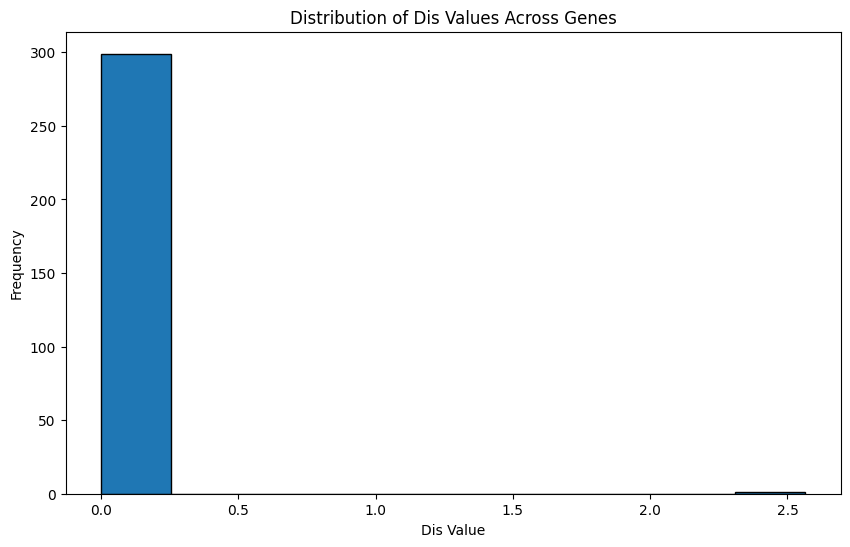

In [ ]:
# Plotting the distribution
plt.figure(figsize=(10, 6))
plt.hist(res_raw['dis'], bins=10, edgecolor='black')
plt.xlabel('Dis Value')
plt.ylabel('Frequency')
plt.title('Distribution of Dis Values Across Genes')
plt.show()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis

df = res_raw

df_filtered = df[df['dis'] != df['dis'].max()]

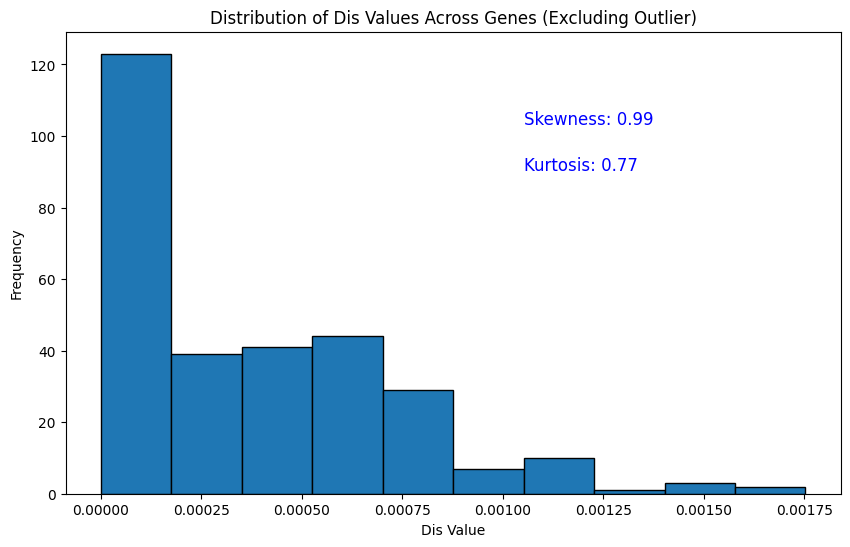

(0.990511627953634, 0.7669409336619437)

In [ ]:
# Calculate skewness and kurtosis
dis_values = df_filtered['dis']
dis_skewness = skew(dis_values)
dis_kurtosis = kurtosis(dis_values)

# Plotting the distribution
plt.figure(figsize=(10, 6))
plt.hist(dis_values, bins=10, edgecolor='black')
plt.xlabel('Dis Value')
plt.ylabel('Frequency')


# Annotate skewness and kurtosis on the plot
plt.text(max(dis_values) * 0.6, max(plt.ylim()) * 0.8, f'Skewness: {dis_skewness:.2f}', fontsize=12, color='blue')
plt.text(max(dis_values) * 0.6, max(plt.ylim()) * 0.7, f'Kurtosis: {dis_kurtosis:.2f}', fontsize=12, color='blue')


plt.title('Distribution of Dis Values Across Genes (Excluding Outlier)')
plt.show()

# Display skewness and kurtosis
dis_skewness, dis_kurtosis

# Digital KOs with GenKI on DBiT-seq

## Perform digital KOs

In [ ]:
# # Install GenKI and torch_geometric as a prerequisite
# ! pip install git+https://github.com/yjgeno/GenKI.git
# ! pip install torch_geometric

# # Install STRINGdb and Networkx for network biology models
# ! pip install stringdb
# ! pip install networkx pandas

In [ ]:
# # Restart kernel
# import os
# os.kill(os.getpid(), 9)

In [ ]:
# import os
# import numpy as np
# import math
# import pandas as pd
# import matplotlib.pyplot as plt
# import scanpy as sc

# sc.settings.verbosity = 0

In [ ]:
# import GenKI as gk
# from GenKI.preprocesing import build_adata
# from GenKI.dataLoader import DataLoader
# from GenKI.train import VGAE_trainer
# from GenKI import utils

# %load_ext autoreload
# %autoreload 2

In [ ]:
# import stringdb
# import networkx as nx

In [ ]:
# Libraries for data wrangling on the adata object
from scipy.sparse import csr_matrix
from scipy.sparse import issparse

In [ ]:
# Download the DBiT-seq dataset suitable for this workshop
!gdown  1D3AIjshsAiIOktmFrvMgqKO1UKiQSPbu

# Assemble adata object for single-cell analysis
adata = sc.read("DBiTseq_UnitedNet.h5ad")
adata

Downloading...
From: https://drive.google.com/uc?id=1D3AIjshsAiIOktmFrvMgqKO1UKiQSPbu
To: /content/DBiTseq_UnitedNet.h5ad
100% 2.36M/2.36M [00:00<00:00, 16.8MB/s]


AnnData object with n_obs × n_vars = 936 × 568
    obs: 'id', 'array_row', 'array_col', 'cell_type', 'batch', 'imagecol', 'imagerow', 'label', 'sample'
    var: 'gene_ids-0', 'gene_ids-1'
    obsm: 'spatial'

In [ ]:
# Let's commence with creating a digital KO of Six2 expression in the DBiT-seq mouse embryo dataset.
gene_of_interest = "Six2"

# Verify that the gene of interest is part of the rownames in adata.var
if gene_of_interest in adata.var.index:
    print(f"The gene {gene_of_interest} is present in the rownames of adata.var.")
else:
    print(f"The gene {gene_of_interest} is not present in the rownames of adata.var.")

The gene Six2 is present in the rownames of adata.var.


In [ ]:
# adata pre-processing to prepare for input in the GenKI tool
adata.layers["norm"] = adata.X.copy()

# The adata.X should be normalised-scaled AND in sparse matrix format!
if not issparse(adata.X):
    sparse_matrix = csr_matrix(adata.X)
    adata.X = sparse_matrix
    print("Converted adata.X to a sparse matrix.")
else:
    print("adata.X is already a sparse matrix.")

Converted adata.X to a sparse matrix.


In [ ]:
# load data

data_wrapper =  DataLoader(
                adata, # adata object
                target_gene = [gene_of_interest], # KO gene name
                target_cell = None, # obsname for cell type, if none use all
                obs_label = "ident", # colname for genes
                GRN_file_dir = "GRNs", # folder name for GRNs
                rebuild_GRN = True, # whether build GRN by pcNet
                pcNet_name = "DBiTseq_example", # GRN file name
                verbose = True, # whether verbose
                n_cpus = 8, # multiprocessing
                )

data_wt = data_wrapper.load_data()
data_ko = data_wrapper.load_kodata()

use all the cells (936) in adata
build GRN


/usr/lib/python3.10/subprocess.py:1796: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = _posixsubprocess.fork_exec(
2024-08-11 11:04:36,266	INFO worker.py:1781 -- Started a local Ray instance.


ray init, using 8 CPUs
execution time of making pcNet: 187.46 s
GRN has been built and saved in "GRNs/DBiTseq_example.npz"
init completed



In [ ]:
#Changed the hyperparameters to better adapt to the spatial dataset in hand

hyperparams = {
    "epochs": 300,  # Increased epochs for more training
    "lr": 5e-2,  # Adjusted learning rate
    "beta": 5e-4,  # Increased beta for stronger regularization
    "seed": 8096  # Trying a different seed
}


log_dir = None

sensei = VGAE_trainer(
    data_wt,
    epochs=hyperparams["epochs"],
    lr=hyperparams["lr"],
    log_dir=log_dir,
    beta=hyperparams["beta"],
    seed=hyperparams["seed"],
    verbose=False,
)

In [ ]:
# %%timeit
sensei.train()

In [ ]:
# sensei.save_model('model_example_DBiTseq')

In [ ]:
# get distance between wt and ko

z_mu_wt, z_std_wt = sensei.get_latent_vars(data_wt)
z_mu_ko, z_std_ko = sensei.get_latent_vars(data_ko)
dis = gk.utils.get_distance(z_mu_ko, z_std_ko, z_mu_wt, z_std_wt, by="KL")
print(dis.shape)

(568,)


In [ ]:
# raw ranked gene list

res_raw = utils.get_generank(data_wt, dis, rank=True)
res_raw.head(10)

,dis,rank
Six2,8423.716324,1
Col3a1,16.065773,2
Col1a2,8.421597,3
Vcan,6.678489,4
Gpc3,6.598462,5
Lgals1,5.790285,6
Fbn2,5.741572,7
Rbp1,5.733980,8
Col4a1,5.731743,9
Cxcl12,5.602060,10


## Calculate the skewness and kurtosis of the distribution of column Dis in the example model

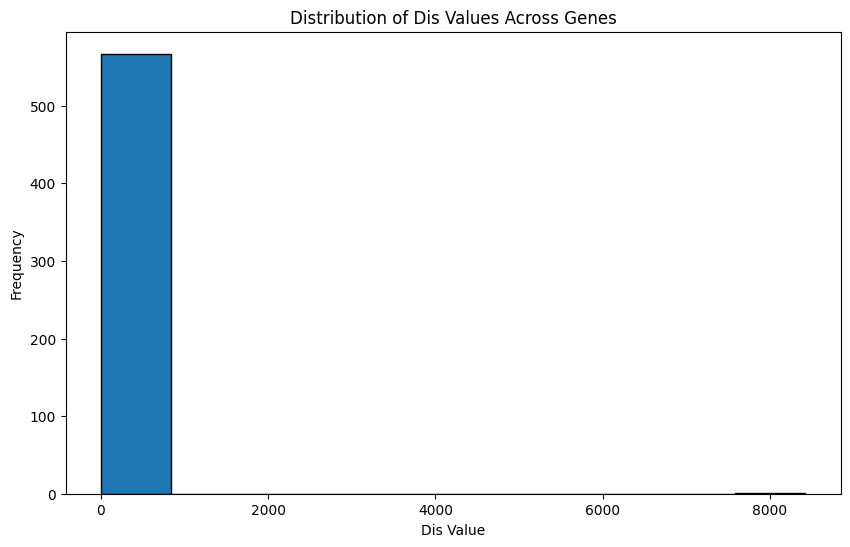

In [ ]:
# Plotting the distribution
plt.figure(figsize=(10, 6))
plt.hist(res_raw['dis'], bins=10, edgecolor='black')
plt.xlabel('Dis Value')
plt.ylabel('Frequency')
plt.title('Distribution of Dis Values Across Genes')
plt.show()

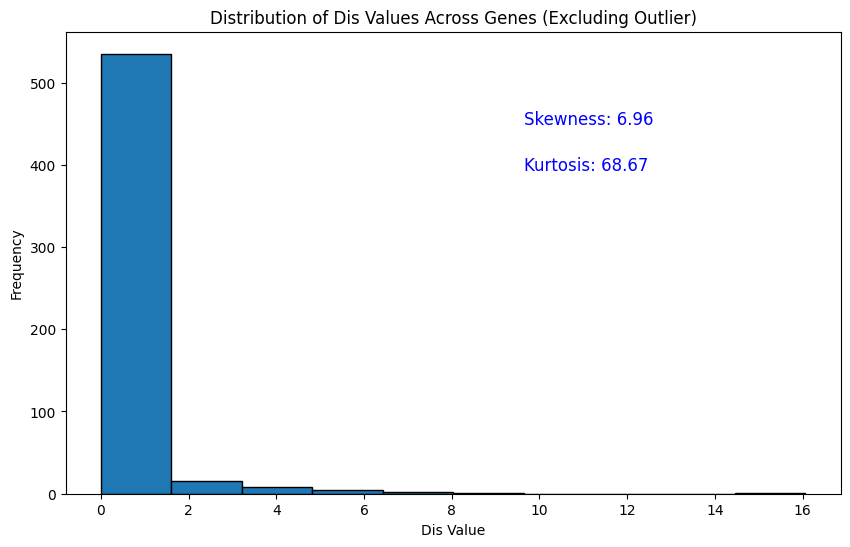

(6.956550085935451, 68.67193680116739)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis

df = res_raw

df_filtered = df[df['dis'] != df['dis'].max()]

# Calculate skewness and kurtosis
dis_values = df_filtered['dis']
dis_skewness = skew(dis_values)
dis_kurtosis = kurtosis(dis_values)

# Plotting the distribution
plt.figure(figsize=(10, 6))
plt.hist(dis_values, bins=10, edgecolor='black')
plt.xlabel('Dis Value')
plt.ylabel('Frequency')


# Annotate skewness and kurtosis on the plot
plt.text(max(dis_values) * 0.6, max(plt.ylim()) * 0.8, f'Skewness: {dis_skewness:.2f}', fontsize=12, color='blue')
plt.text(max(dis_values) * 0.6, max(plt.ylim()) * 0.7, f'Kurtosis: {dis_kurtosis:.2f}', fontsize=12, color='blue')


plt.title('Distribution of Dis Values Across Genes (Excluding Outlier)')
plt.show()

# Display skewness and kurtosis
dis_skewness, dis_kurtosis

## Hyperparameters and grid search to the dataset

In [ ]:
# Define the hyperparameters and ranges for grid search
hyperparams = {
    "epochs": 300,  # Increased epochs for more training
    "seed": 8096  # Trying a different seed
}

log_dir = None

# Define the range of learning rates and beta values to test
learning_rates = [1e-3, 1e-2, 5e-2, 1e-1, 5e-1]
beta_values = [1e-5, 5e-5, 1e-4, 5e-4, 1e-3]

# Function to train and evaluate the model, returning the ranked genes
def train_and_evaluate_return_genes(lr, beta):
    sensei = VGAE_trainer(
        data_wt,
        epochs=hyperparams["epochs"],
        lr=lr,
        log_dir=log_dir,
        beta=beta,
        seed=hyperparams["seed"],
        verbose=False,
    )
    sensei.train()

    z_mu_wt, z_std_wt = sensei.get_latent_vars(data_wt)
    z_mu_ko, z_std_ko = sensei.get_latent_vars(data_ko)
    dis = gk.utils.get_distance(z_mu_ko, z_std_ko, z_mu_wt, z_std_wt, by="KL")

    res_raw = utils.get_generank(data_wt, dis, rank=True)
    return res_raw

# Dictionary to store the results
results_genes = {}

# Loop over the range of learning rates and beta values
for lr in learning_rates:
    for beta in beta_values:
        res_raw = train_and_evaluate_return_genes(lr, beta)
        results_genes[(lr, beta)] = res_raw
        print(f"Learning Rate: {lr}, Beta: {beta}, Top Genes: \n{res_raw.head(10)}\n")

# After the loop, print all results for further inspection
for (lr, beta), res_raw in results_genes.items():
    print(f"\nLearning Rate: {lr}, Beta: {beta}")
    print(res_raw.head(10))

Learning Rate: 0.001, Beta: 1e-05, Top Genes: 
                 dis  rank
Copb2   1.494926e-10     1
Kctd12  1.480944e-10     2
Col4a1  1.415956e-11     3
Hba-a1  1.415068e-11     4
Glra1   1.396661e-11     5
Hbb-y   1.385714e-11     6
Hba-a2  1.370548e-11     7
Cxcl12  1.263256e-11     8
Col1a2  1.096567e-11     9
Col3a1  8.823609e-12    10

Learning Rate: 0.001, Beta: 5e-05, Top Genes: 
                 dis  rank
Copb2   1.494829e-10     1
Kctd12  1.485732e-10     2
Hba-a1  1.494249e-11     3
Hbb-y   1.385914e-11     4
Col4a1  1.375233e-11     5
Glra1   1.344991e-11     6
Hba-a2  1.306533e-11     7
Cxcl12  1.210032e-11     8
Col1a2  1.161449e-11     9
Col3a1  8.730350e-12    10

Learning Rate: 0.001, Beta: 0.0001, Top Genes: 
                 dis  rank
Copb2   1.494904e-10     1
Kctd12  1.491987e-10     2
Col4a1  1.416645e-11     3
Hba-a1  1.415024e-11     4
Glra1   1.409339e-11     5
Hbb-y   1.379252e-11     6
Hba-a2  1.370482e-11     7
Cxcl12  1.264233e-11     8
Col1a2  1.147948e-1

/usr/local/lib/python3.10/dist-packages/GenKI/utils.py:46: RuntimeWarning: invalid value encountered in scalar divide
  np.linalg.det(S1) / np.linalg.det(S0)


Learning Rate: 0.5, Beta: 1e-05, Top Genes: 
                  dis  rank
Gm8292   2.371035e+15     1
Six1     1.814306e+15     2
Parm1    3.544818e+14     3
Alx1     2.636548e+14     4
Sparcl1  2.162101e+14     5
Nfatc4   1.470254e+14     6
Tes      4.851344e+13     7
Frmd6    3.194389e+13     8
Epcam    1.637800e+13     9
Ptprz1   1.310082e+13    10



/usr/local/lib/python3.10/dist-packages/GenKI/utils.py:46: RuntimeWarning: invalid value encountered in scalar divide
  np.linalg.det(S1) / np.linalg.det(S0)


Learning Rate: 0.5, Beta: 5e-05, Top Genes: 
                 dis  rank
Pitx1   3.135530e-01     1
Foxg1   1.174317e-04     2
Gpr89   4.175294e-05     3
Hba-a2  2.174939e-05     4
Hba-a1  2.128475e-05     5
Hba-x   1.758215e-05     6
Kctd12  1.149878e-06     7
Col4a1  1.056670e-06     8
Cxcl12  9.809987e-07     9
Col1a2  9.466198e-07    10



/usr/local/lib/python3.10/dist-packages/GenKI/utils.py:46: RuntimeWarning: invalid value encountered in scalar divide
  np.linalg.det(S1) / np.linalg.det(S0)


Learning Rate: 0.5, Beta: 0.0001, Top Genes: 
                 dis  rank
Pitx1   3.746639e+07     1
Gap43   1.551276e+02     2
Foxg1   1.219845e+01     3
Hba-a1  9.216849e+00     4
Hba-x   8.874584e+00     5
Hba-a2  8.655033e+00     6
Gpr89   8.032769e+00     7
Hdac4   3.889166e+00     8
Ttn     2.121481e+00     9
Hbb-y   1.436997e+00    10

Learning Rate: 0.5, Beta: 0.0005, Top Genes: 
              dis  rank
Foxg1    0.000050     1
Hdac4    0.000040     2
Gm8292   0.000016     3
Gm11263  0.000009     4
Igfbp5   0.000009     5
Myl3     0.000004     6
Myh7     0.000003     7
Myh6     0.000003     8
Ttn      0.000003     9
Hba-a1   0.000002    10

Learning Rate: 0.5, Beta: 0.001, Top Genes: 
                  dis  rank
Gpr89    4.654489e+14     1
Mrpl57   6.581136e+10     2
Gm11263  4.833268e-04     3
Foxg1    3.461426e-04     4
Dpy19l1  1.039465e-04     5
Ttn      3.249073e-05     6
Hdac4    2.382079e-05     7
Col3a1   8.833726e-06     8
Myl3     6.507684e-06     9
Myh7     5.842495e-0

/usr/local/lib/python3.10/dist-packages/GenKI/utils.py:46: RuntimeWarning: invalid value encountered in scalar divide
  np.linalg.det(S1) / np.linalg.det(S0)


## 4 models are fitting in the GenKI description, calculate their skewness and kurtosis

### hyper1: hyperparameters lr= 0.1, beta= 0.0001

In [ ]:
# hyperparameters lr=0.1 beta= 0.0001

hyperparams = {
    "epochs": 300,  # Increased epochs for more training
    "lr": 0.1,  # Adjusted learning rate
    "beta": 0.0001,  # Increased beta for stronger regularization
    "seed": 8096  # Trying a different seed
}


log_dir = None

sensei = VGAE_trainer(
    data_wt,
    epochs=hyperparams["epochs"],
    lr=hyperparams["lr"],
    log_dir=log_dir,
    beta=hyperparams["beta"],
    seed=hyperparams["seed"],
    verbose=False,
)

In [ ]:
sensei.train()

In [ ]:
# save the model

sensei.save_model('hyper1_DBiTseq')

save model parameters to model/hyper1_DBiTseq.th


In [ ]:
# get distance between wt and ko

z_mu_wt, z_std_wt = sensei.get_latent_vars(data_wt)
z_mu_ko, z_std_ko = sensei.get_latent_vars(data_ko)
dis = gk.utils.get_distance(z_mu_ko, z_std_ko, z_mu_wt, z_std_wt, by="KL")
print(dis.shape)

# raw ranked gene list

res_raw = utils.get_generank(data_wt, dis, rank=True)
res_raw.head(10)

(568,)


,dis,rank
Six2,11368.896847,1
Sulf1,1.402153,2
Igsf3,1.207820,3
Arhgap1,1.140110,4
Synpo,1.106606,5
Tgfbi,1.092092,6
Sparc,1.069306,7
Pkdcc,1.063412,8
Anxa2,1.043483,9
Elk3,0.966740,10


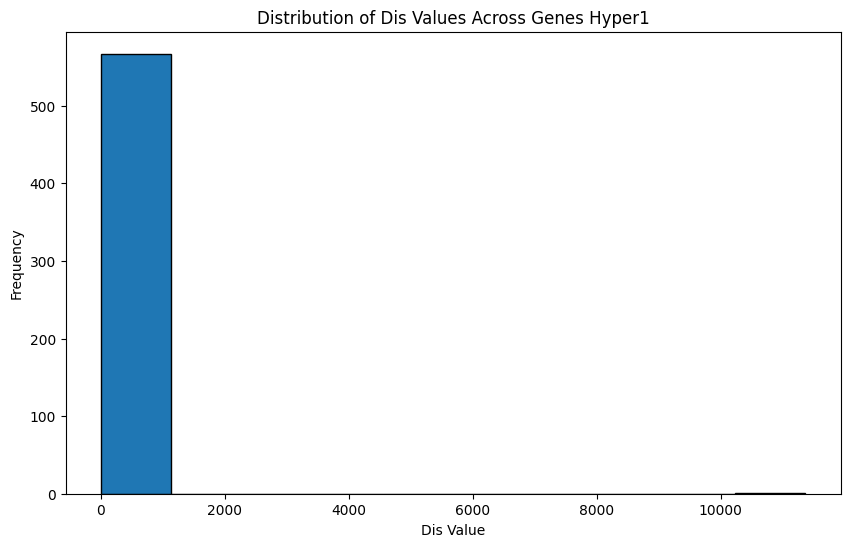

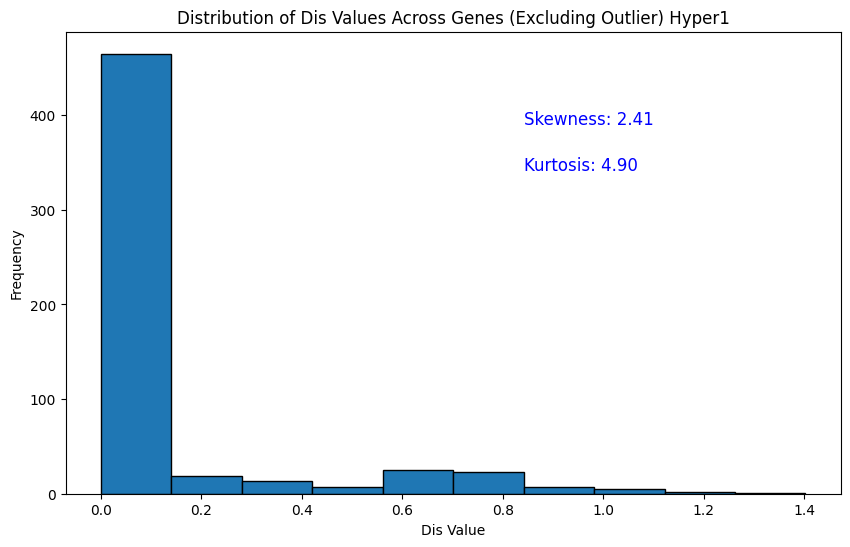

(2.4087631725892247, 4.904718234489209)

In [ ]:
# Plotting the distribution
plt.figure(figsize=(10, 6))
plt.hist(res_raw['dis'], bins=10, edgecolor='black')
plt.xlabel('Dis Value')
plt.ylabel('Frequency')
plt.title('Distribution of Dis Values Across Genes Hyper1')
plt.show()

import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis

df = res_raw

df_filtered = df[df['dis'] != df['dis'].max()]

# Calculate skewness and kurtosis
dis_values = df_filtered['dis']
dis_skewness = skew(dis_values)
dis_kurtosis = kurtosis(dis_values)

# Plotting the distribution
plt.figure(figsize=(10, 6))
plt.hist(dis_values, bins=10, edgecolor='black')
plt.xlabel('Dis Value')
plt.ylabel('Frequency')


# Annotate skewness and kurtosis on the plot
plt.text(max(dis_values) * 0.6, max(plt.ylim()) * 0.8, f'Skewness: {dis_skewness:.2f}', fontsize=12, color='blue')
plt.text(max(dis_values) * 0.6, max(plt.ylim()) * 0.7, f'Kurtosis: {dis_kurtosis:.2f}', fontsize=12, color='blue')


plt.title('Distribution of Dis Values Across Genes (Excluding Outlier) Hyper1')
plt.show()

# Display skewness and kurtosis
dis_skewness, dis_kurtosis

### hyper2: hyperparameters lr= 0.05, beta: 0.0001

In [ ]:
# hyperparameters lr=0.05 beta= 0.0001

hyperparams = {
    "epochs": 300,  # Increased epochs for more training
    "lr": 0.05,  # Adjusted learning rate
    "beta": 0.0001,  # Increased beta for stronger regularization
    "seed": 8096  # Trying a different seed
}


log_dir = None

sensei = VGAE_trainer(
    data_wt,
    epochs=hyperparams["epochs"],
    lr=hyperparams["lr"],
    log_dir=log_dir,
    beta=hyperparams["beta"],
    seed=hyperparams["seed"],
    verbose=False,
)

In [ ]:
sensei.train()

In [ ]:
# save the model

sensei.save_model('hyper2_DBiTseq')

save model parameters to model/hyper2_DBiTseq.th


In [ ]:
# get distance between wt and ko

z_mu_wt, z_std_wt = sensei.get_latent_vars(data_wt)
z_mu_ko, z_std_ko = sensei.get_latent_vars(data_ko)
dis = gk.utils.get_distance(z_mu_ko, z_std_ko, z_mu_wt, z_std_wt, by="KL")
print(dis.shape)

# raw ranked gene list

res_raw = utils.get_generank(data_wt, dis, rank=True)
res_raw.head(10)

(568,)


,dis,rank
Six2,374977.585988,1
Col3a1,8652.828745,2
Hba-a2,5649.671488,3
Hbb-y,5276.064550,4
Hba-a1,4970.662340,5
Hba-x,4834.479136,6
Hbb-bh1,4618.083816,7
Glra1,4062.152232,8
Fbn2,2864.114269,9
Cnn2,2576.272493,10


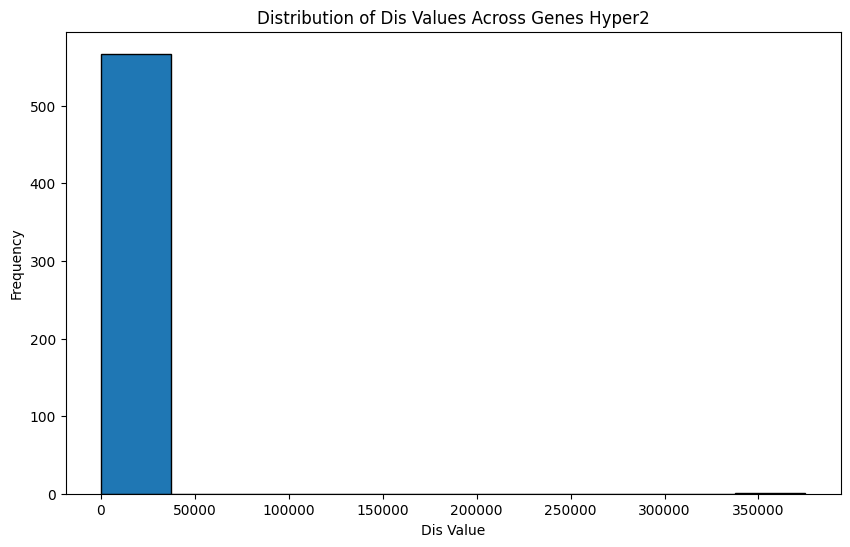

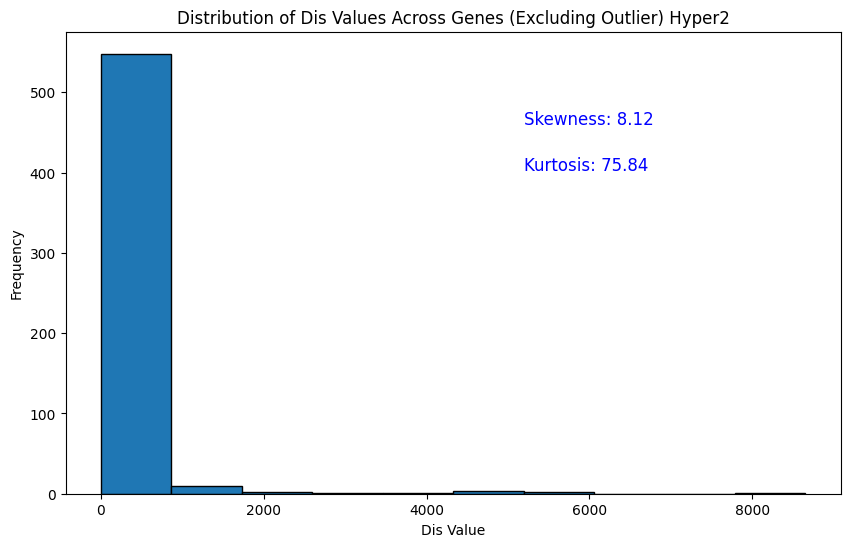

(8.115084322362014, 75.83915215148377)

In [ ]:
# Plotting the distribution
plt.figure(figsize=(10, 6))
plt.hist(res_raw['dis'], bins=10, edgecolor='black')
plt.xlabel('Dis Value')
plt.ylabel('Frequency')
plt.title('Distribution of Dis Values Across Genes Hyper2')
plt.show()

import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis

df = res_raw

df_filtered = df[df['dis'] != df['dis'].max()]

# Calculate skewness and kurtosis
dis_values = df_filtered['dis']
dis_skewness = skew(dis_values)
dis_kurtosis = kurtosis(dis_values)

# Plotting the distribution
plt.figure(figsize=(10, 6))
plt.hist(dis_values, bins=10, edgecolor='black')
plt.xlabel('Dis Value')
plt.ylabel('Frequency')


# Annotate skewness and kurtosis on the plot
plt.text(max(dis_values) * 0.6, max(plt.ylim()) * 0.8, f'Skewness: {dis_skewness:.2f}', fontsize=12, color='blue')
plt.text(max(dis_values) * 0.6, max(plt.ylim()) * 0.7, f'Kurtosis: {dis_kurtosis:.2f}', fontsize=12, color='blue')


plt.title('Distribution of Dis Values Across Genes (Excluding Outlier) Hyper2')
plt.show()

# Display skewness and kurtosis
dis_skewness, dis_kurtosis

### hyper3: hyperparameters lr=0.1, beta=5e-05

In [ ]:
# hyperparameters lr=0.1 beta= 5e-05

hyperparams = {
    "epochs": 300,  # Increased epochs for more training
    "lr": 0.1,  # Adjusted learning rate
    "beta": 5e-05,  # Increased beta for stronger regularization
    "seed": 8096  # Trying a different seed
}


log_dir = None

sensei = VGAE_trainer(
    data_wt,
    epochs=hyperparams["epochs"],
    lr=hyperparams["lr"],
    log_dir=log_dir,
    beta=hyperparams["beta"],
    seed=hyperparams["seed"],
    verbose=False,
)

In [ ]:
sensei.train()

In [ ]:
# save the model

sensei.save_model('hyper3_DBiTseq')

save model parameters to model/hyper3_DBiTseq.th


In [ ]:
# get distance between wt and ko

z_mu_wt, z_std_wt = sensei.get_latent_vars(data_wt)
z_mu_ko, z_std_ko = sensei.get_latent_vars(data_ko)
dis = gk.utils.get_distance(z_mu_ko, z_std_ko, z_mu_wt, z_std_wt, by="KL")
print(dis.shape)

# raw ranked gene list

res_raw = utils.get_generank(data_wt, dis, rank=True)
res_raw.head(10)

(568,)


,dis,rank
Six2,13846.320149,1
Tagln,7.823785,2
Sparc,5.486094,3
Tgfbi,5.375524,4
Col26a1,5.343307,5
Foxp2,4.954372,6
Foxc1,4.484856,7
Vcan,4.229668,8
Cxcl12,3.892971,9
Col1a2,3.865877,10


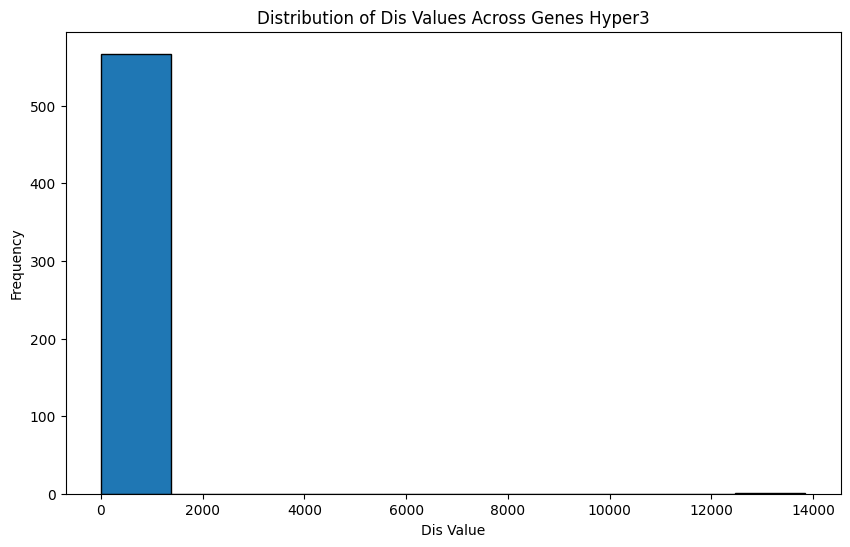

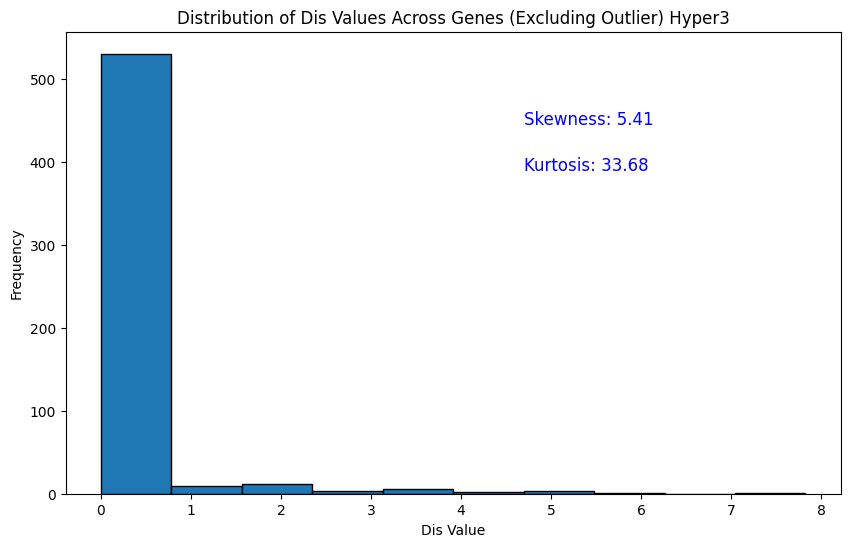

(5.40623079096619, 33.67895022837398)

In [ ]:
# Plotting the distribution
plt.figure(figsize=(10, 6))
plt.hist(res_raw['dis'], bins=10, edgecolor='black')
plt.xlabel('Dis Value')
plt.ylabel('Frequency')
plt.title('Distribution of Dis Values Across Genes Hyper3')
plt.show()

import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis

df = res_raw

df_filtered = df[df['dis'] != df['dis'].max()]

# Calculate skewness and kurtosis
dis_values = df_filtered['dis']
dis_skewness = skew(dis_values)
dis_kurtosis = kurtosis(dis_values)

# Plotting the distribution
plt.figure(figsize=(10, 6))
plt.hist(dis_values, bins=10, edgecolor='black')
plt.xlabel('Dis Value')
plt.ylabel('Frequency')


# Annotate skewness and kurtosis on the plot
plt.text(max(dis_values) * 0.6, max(plt.ylim()) * 0.8, f'Skewness: {dis_skewness:.2f}', fontsize=12, color='blue')
plt.text(max(dis_values) * 0.6, max(plt.ylim()) * 0.7, f'Kurtosis: {dis_kurtosis:.2f}', fontsize=12, color='blue')


plt.title('Distribution of Dis Values Across Genes (Excluding Outlier) Hyper3')
plt.show()

# Display skewness and kurtosis
dis_skewness, dis_kurtosis

### hyper4: hyperparameters lr=0.05, beta=1e-05

In [ ]:
# hyperparameters lr=0.05 beta= 1e-05

hyperparams = {
    "epochs": 300,  # Increased epochs for more training
    "lr": 0.05,  # Adjusted learning rate
    "beta": 1e-05,  # Increased beta for stronger regularization
    "seed": 8096  # Trying a different seed
}


log_dir = None

sensei = VGAE_trainer(
    data_wt,
    epochs=hyperparams["epochs"],
    lr=hyperparams["lr"],
    log_dir=log_dir,
    beta=hyperparams["beta"],
    seed=hyperparams["seed"],
    verbose=False,
)

In [ ]:
sensei.train()

In [ ]:
# save the model

sensei.save_model('hyper4_DBiTseq')

save model parameters to model/hyper4_DBiTseq.th


In [ ]:
# get distance between wt and ko

z_mu_wt, z_std_wt = sensei.get_latent_vars(data_wt)
z_mu_ko, z_std_ko = sensei.get_latent_vars(data_ko)
dis = gk.utils.get_distance(z_mu_ko, z_std_ko, z_mu_wt, z_std_wt, by="KL")
print(dis.shape)

# raw ranked gene list

res_raw = utils.get_generank(data_wt, dis, rank=True)
res_raw.head(10)

(568,)


,dis,rank
Six2,348539.779142,1
Col3a1,117541.714707,2
Hba-a2,115278.661449,3
Hbb-y,106446.732377,4
Hba-x,99824.742114,5
Pak3,98585.190454,6
Glra1,97527.397992,7
Hbb-bh1,93432.961263,8
Hba-a1,91113.252139,9
Ednrb,89943.866356,10


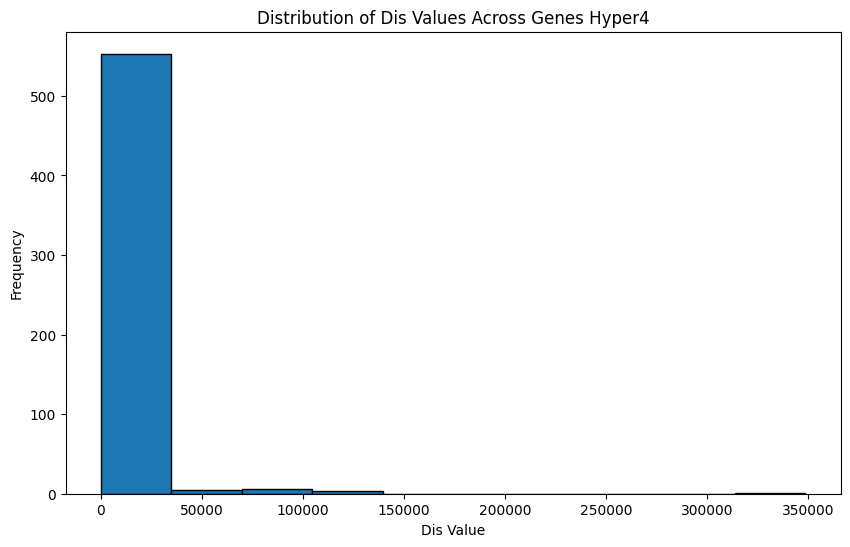

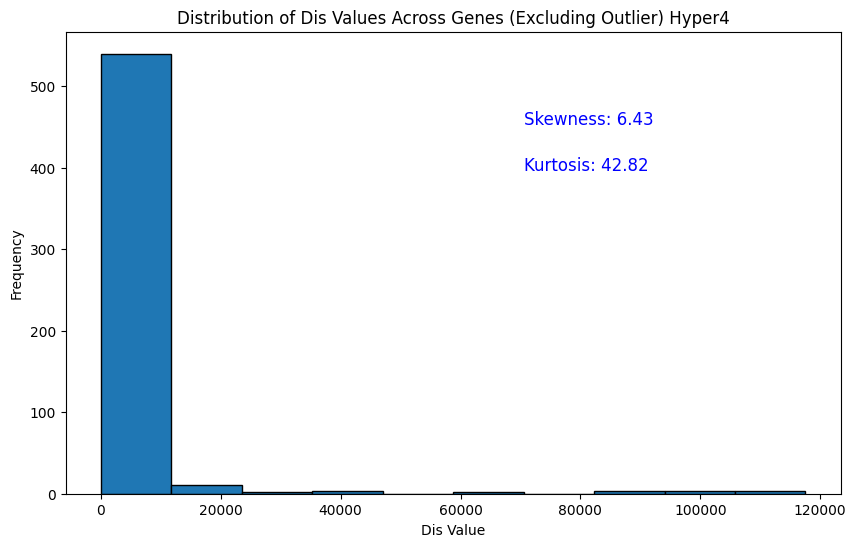

(6.433537079966773, 42.81570175395847)

In [ ]:
# Plotting the distribution
plt.figure(figsize=(10, 6))
plt.hist(res_raw['dis'], bins=10, edgecolor='black')
plt.xlabel('Dis Value')
plt.ylabel('Frequency')
plt.title('Distribution of Dis Values Across Genes Hyper4')
plt.show()

import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis

df = res_raw

df_filtered = df[df['dis'] != df['dis'].max()]

# Calculate skewness and kurtosis
dis_values = df_filtered['dis']
dis_skewness = skew(dis_values)
dis_kurtosis = kurtosis(dis_values)

# Plotting the distribution
plt.figure(figsize=(10, 6))
plt.hist(dis_values, bins=10, edgecolor='black')
plt.xlabel('Dis Value')
plt.ylabel('Frequency')


# Annotate skewness and kurtosis on the plot
plt.text(max(dis_values) * 0.6, max(plt.ylim()) * 0.8, f'Skewness: {dis_skewness:.2f}', fontsize=12, color='blue')
plt.text(max(dis_values) * 0.6, max(plt.ylim()) * 0.7, f'Kurtosis: {dis_kurtosis:.2f}', fontsize=12, color='blue')


plt.title('Distribution of Dis Values Across Genes (Excluding Outlier) Hyper4')
plt.show()

# Display skewness and kurtosis
dis_skewness, dis_kurtosis

## Stringdb network results of 4 models and example models


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import stringdb
import numpy as np
import seaborn as sns

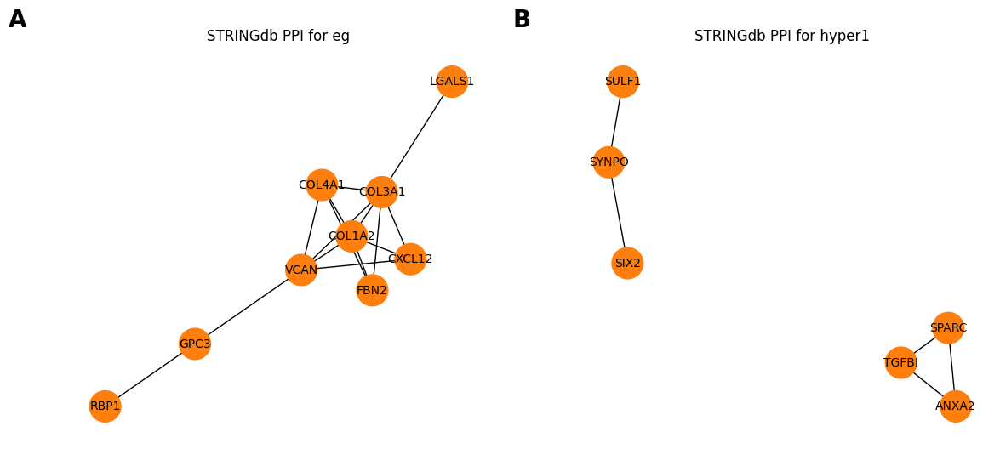

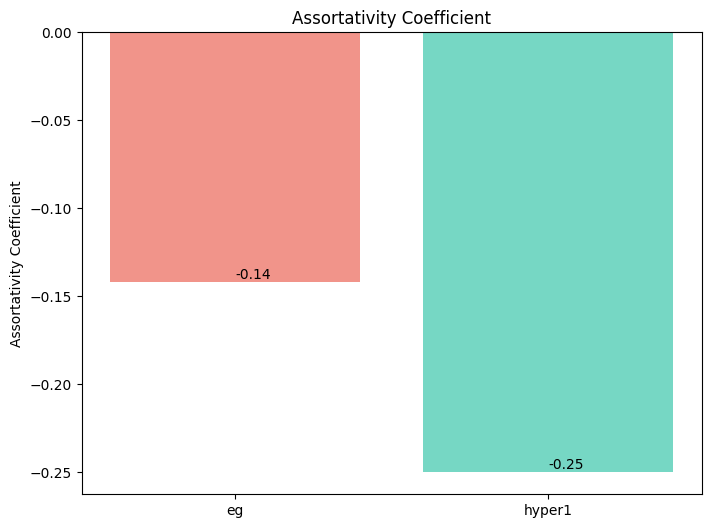

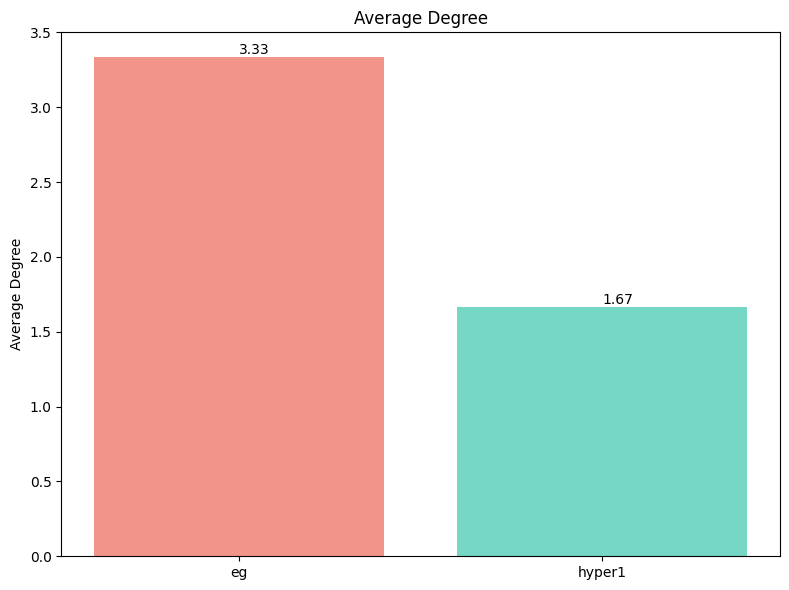

In [ ]:
# Define the colours for different gene sets
colors = {
    'eg': '#F1948A',      # Light Red
    'hyper1': '#76D7C4',  # Light Teal
}

# Define the sets of genes
gene_sets = {
    'eg': ['Six2', 'Col3a1', 'Col1a2', 'Vcan', 'Gpc3', 'Lgals1', 'Fbn2', 'Rbp1', 'Col4a1', 'Cxcl12'],
    'hyper1': ['Six2', 'Sulf1', 'Igsf3', 'Arhgap1', 'Synpo', 'Tgfbi', 'Sparc', 'Pkdcc', 'Anxa2', 'Elk3']
}

# Initialize lists to store network metrics
assortativity_coefficients = []
average_degrees = []

# Create a figure for the STRING networks in a 1x2 grid
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# Iterate through each set of genes
for idx, (set_name, genes) in enumerate(gene_sets.items()):
    # Get the STRING IDs for the genes
    string_ids = stringdb.get_string_ids(genes, species=10090)  # 10090 for mouse

    # Get the network data for the STRING IDs with a required score of 400
    network_df = stringdb.get_network(string_ids.queryItem, required_score=400)

    # Create a new graph
    STRING = nx.Graph()

    # Add edges to the graph from the DataFrame
    for index, row in network_df.iterrows():
        STRING.add_edge(row['preferredName_A'], row['preferredName_B'], weight=row['score'])

    # Calculate assortativity coefficient
    try:
        assortativity_coefficient = nx.degree_assortativity_coefficient(STRING)
    except ZeroDivisionError:
        assortativity_coefficient = float('nan')
    assortativity_coefficients.append((set_name, assortativity_coefficient))

    # Calculate average degree
    if len(STRING) > 0:
        average_degree = sum(dict(STRING.degree()).values()) / len(STRING)
    else:
        average_degree = float('nan')
    average_degrees.append((set_name, average_degree))

    # Determine node colors
    group_color = colors[set_name]
    node_colors = [group_color if node in genes else '#ff7f0e' for node in STRING.nodes()]

    # Draw the graph in the 1x2 grid
    pos = nx.spring_layout(STRING)  # positions for all nodes
    ax = axes[idx]  # Select the subplot axis
    nx.draw(STRING, pos, with_labels=True, node_size=700, node_color=node_colors, font_size=10, ax=ax)
    ax.set_title(f'STRINGdb PPI for {set_name}')

    # Add subplot indicators
    ax.text(-0.1, 1.1, chr(65 + idx), transform=ax.transAxes, fontsize=20, fontweight='bold', va='top', ha='right')

# Plot Assortativity Coefficient
fig, ax = plt.subplots(figsize=(8, 6))
labels, values = zip(*assortativity_coefficients)
colors_assortativity = [colors[label] for label in labels]
bars = ax.bar(labels, values, color=colors_assortativity)
ax.set_title('Assortativity Coefficient')
ax.set_ylabel('Assortativity Coefficient')
ax.grid(False)

# Add values on top of the bars
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), va='bottom')  # va: vertical alignment

# Plot Average Degree
fig, ax = plt.subplots(figsize=(8, 6))
labels, values = zip(*average_degrees)
colors_avg_degree = [colors[label] for label in labels]
bars = ax.bar(labels, values, color=colors_avg_degree)
ax.set_title('Average Degree')
ax.set_ylabel('Average Degree')
ax.grid(False)

# Add values on top of the bars
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), va='bottom')  # va: vertical alignment

# Show plots
plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))
/usr/local/lib/python3.10/dist-packages/networkx/algorithms/assortativity/correlation.py:302: RuntimeWarning: invalid value encountered in scalar divide
  return float((xy * (M - ab)).sum() / np.sqrt(vara * varb))


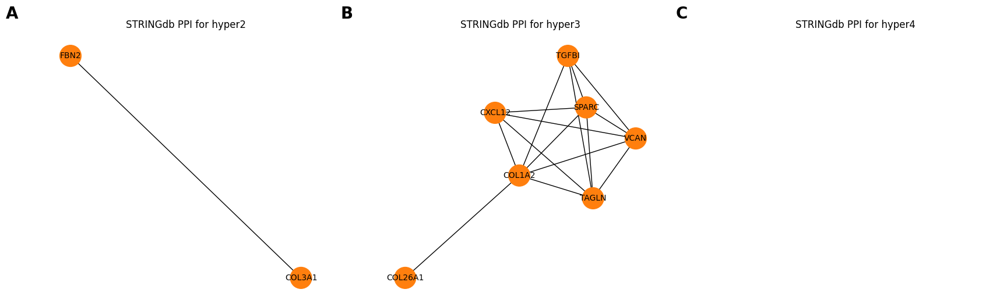

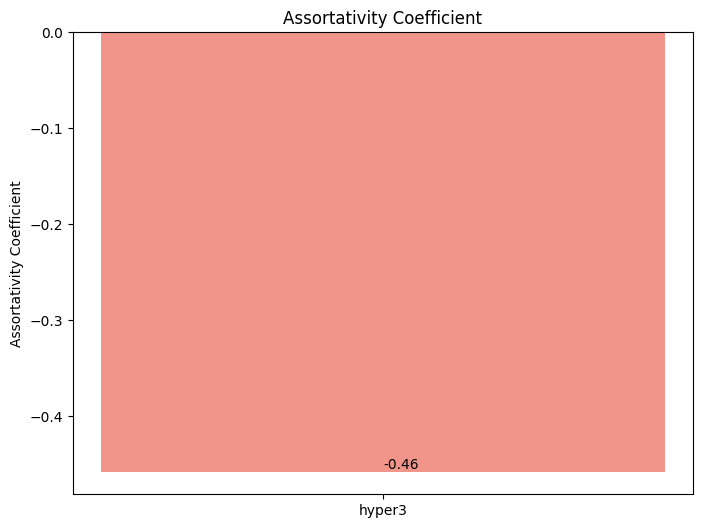

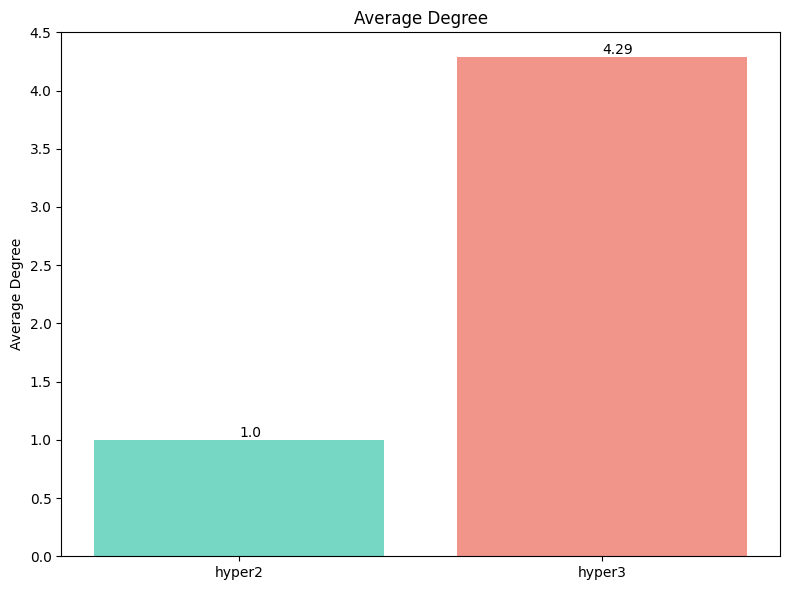

In [ ]:
# Define the colors for different gene sets
colors = {
    'hyper2': '#76D7C4',  # Light Teal
    'hyper3': '#F1948A',  # Light Red
    'hyper4': '#F7DC6F',  # Light Yellow
}

# Define the sets of genes
gene_sets = {
    'hyper2': ['Six2', 'Col3a1', 'Hba-a2', 'Hbb-y', 'Hba-a1', 'Hba-x', 'Hbb-bh1', 'Glra1', 'Fbn2', 'Cnn2'],
    'hyper3': ['Six2', 'Tagln', 'Sparc', 'Tgfbi', 'Col26a1', 'Foxp2', 'Foxc1', 'Vcan', 'Cxcl12', 'Col1a2'],
    'hyper4': ['Six2', 'Col3a1', 'Hba-a2', 'Hbb-y', 'Hba-x', 'Pak3', 'Glra1', 'Hbb-bh1', 'Hba-a1', 'Ednrb']
}

# Initialize lists to store network metrics
assortativity_coefficients = []
average_degrees = []

# Create a figure for the STRING networks in a 1x3 grid
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(21, 6))

# Iterate through each set of genes
for idx, (set_name, genes) in enumerate(gene_sets.items()):
    string_ids = stringdb.get_string_ids(genes, species=10090)
    network_df = stringdb.get_network(string_ids.queryItem, required_score=400)

    STRING = nx.Graph()

    # Add edges to the graph from the DataFrame
    for index, row in network_df.iterrows():
        STRING.add_edge(row['preferredName_A'], row['preferredName_B'], weight=row['score'])

    # Calculate assortativity coefficient
    try:
        assortativity_coefficient = nx.degree_assortativity_coefficient(STRING)
    except ZeroDivisionError:
        assortativity_coefficient = float('nan')
    assortativity_coefficients.append((set_name, assortativity_coefficient))

    # Calculate average degree
    if len(STRING) > 0:
        average_degree = sum(dict(STRING.degree()).values()) / len(STRING)
    else:
        average_degree = float('nan')
    average_degrees.append((set_name, average_degree))

    # Determine node colors
    group_color = colors[set_name]
    node_colors = [group_color if node in genes else '#ff7f0e' for node in STRING.nodes()]

    # Create a dictionary for labels to retain original gene casing
    node_labels = {node: node for node in STRING.nodes()}

    # Draw the graph in the 1x3 grid
    pos = nx.spring_layout(STRING)  # positions for all nodes
    ax = axes[idx]  # Select the subplot axis
    nx.draw(STRING, pos, labels=node_labels, with_labels=True, node_size=700, node_color=node_colors, font_size=10, ax=ax)
    ax.set_title(f'STRINGdb PPI for {set_name}')

    # Add subplot indicators
    ax.text(-0.1, 1.1, chr(65 + idx), transform=ax.transAxes, fontsize=20, fontweight='bold', va='top', ha='right')

# Plot Assortativity Coefficient
fig, ax = plt.subplots(figsize=(8, 6))
labels, values = zip(*assortativity_coefficients)
colors_assortativity = [colors[label] for label in labels]
bars = ax.bar(labels, values, color=colors_assortativity)
ax.set_title('Assortativity Coefficient')
ax.set_ylabel('Assortativity Coefficient')
ax.grid(False)

# Add values on top of the bars
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), va='bottom')  # va: vertical alignment

# Plot Average Degree
fig, ax = plt.subplots(figsize=(8, 6))
labels, values = zip(*average_degrees)
colors_avg_degree = [colors[label] for label in labels]
bars = ax.bar(labels, values, color=colors_avg_degree)
ax.set_title('Average Degree')
ax.set_ylabel('Average Degree')
ax.grid(False)

# Add values on top of the bars
for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 2), va='bottom')  # va: vertical alignment

# Show plots
plt.tight_layout()
plt.show()

Top 10 Pathways:
6                             Supramolecular polymer
48                          ECM-receptor interaction
26                    Basement membrane organization
170           Signaling by Receptor Tyrosine Kinases
178                      Abnormal kidney development
25                    Morphogenesis of an epithelium
24                        Animal organ morphogenesis
23     Branching morphogenesis of an epithelial tube
22                                Limb morphogenesis
50                      Collagen triple helix repeat
Name: description, dtype: object


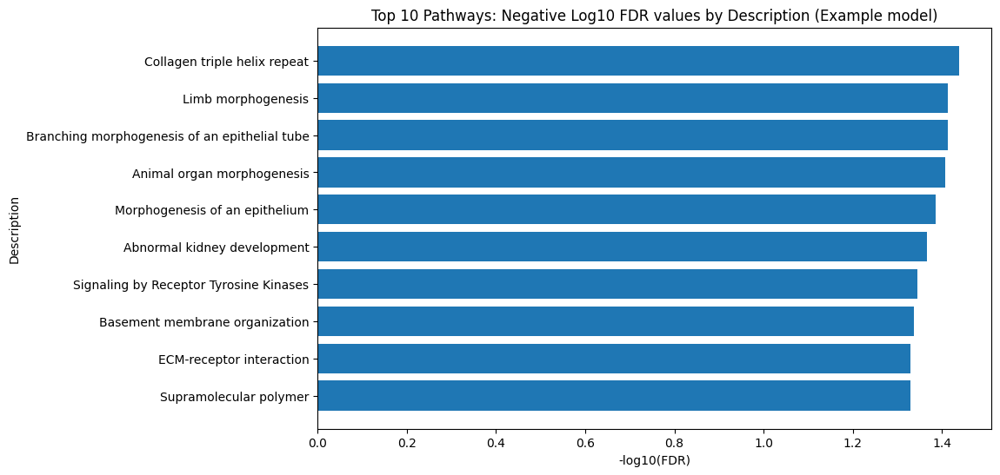

In [ ]:
eg_genes = ["Six2", "Col3a1", "Col1a2", "Vcan", "Gpc3", "Lgals1", "Fbn2", "Rbp1", "Col4a1", "Cxcl12"]
string_ids = stringdb.get_string_ids(eg_genes, species = 10090)   # human is 'species=9606'

# Perform pathway enrichment
enrichment_df = stringdb.get_enrichment(string_ids.queryItem, species = 10090)
enrichment_df
df = enrichment_df
sorted_df = df.sort_values(by='fdr', ascending=False)

# Select the top 10 pathways to visualise
top_10_pathways = sorted_df['description'].head(10)

print("Top 10 Pathways:")
print(top_10_pathways)

# Plotting negative log10 of FDR values against description to discern most significant pathways
plt.figure(figsize=(10, 6))
plt.barh(sorted_df['description'].head(10), -1 * sorted_df['fdr'].head(10).apply(lambda x: math.log10(x)))
plt.xlabel('-log10(FDR)')
plt.ylabel('Description')
plt.title('Top 10 Pathways: Negative Log10 FDR values by Description (Example model)')
plt.show()

Top 10 Pathways:
2               Basement membrane
1                Tube development
3    Extracellular matrix binding
4             Embryonic structure
0     Skeletal system development
Name: description, dtype: object


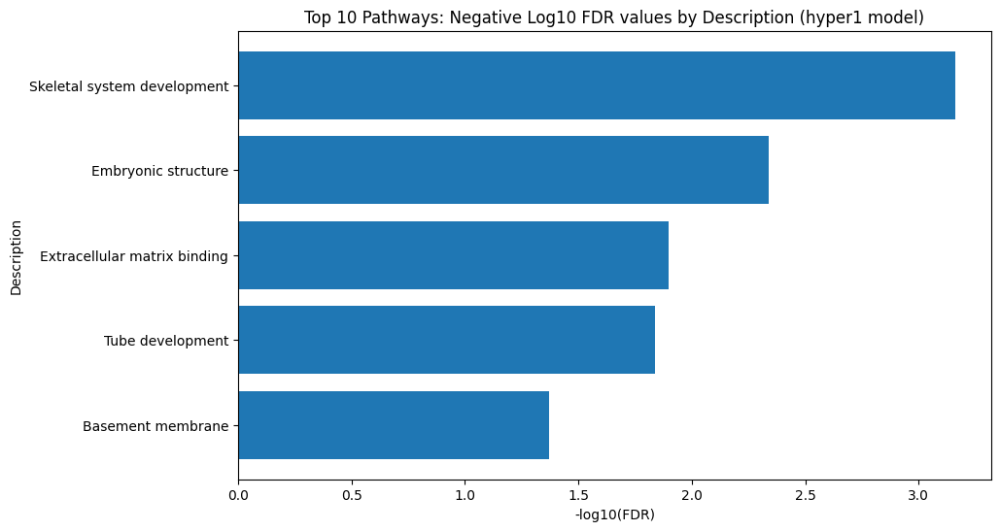

In [ ]:
# Define the gene lists
hyper1_genes = ["Six2", "Sulf1", "Igsf3", "Arhgap1", "Synpo", "Tgfbi", "Sparc", "Pkdcc", "Anxa2", "Elk3"]
string_ids = stringdb.get_string_ids(hyper1_genes, species = 10090)   # human is 9606

# Perform pathway enrichment
enrichment_df = stringdb.get_enrichment(string_ids.queryItem, species = 10090)
enrichment_df
df = enrichment_df
sorted_df = df.sort_values(by='fdr', ascending=False)

# Select the top 10 pathways to visualise
top_10_pathways = sorted_df['description'].head(10)

print("Top 10 Pathways:")
print(top_10_pathways)

# Plotting negative log10 of FDR values against description to discern most significant pathways
plt.figure(figsize=(10, 6))
plt.barh(sorted_df['description'].head(10), -1 * sorted_df['fdr'].head(10).apply(lambda x: math.log10(x)))
plt.xlabel('-log10(FDR)')
plt.ylabel('Description')
plt.title('Top 10 Pathways: Negative Log10 FDR values by Description (hyper1 model)')
plt.show()

Top 10 Pathways:
14                                            Whole body
8                                    Germ cell migration
9                               Animal organ development
119                                  Perinatal lethality
7                                 Epithelium development
13                                     Connective tissue
111    (2023) Development of a method for isolating b...
112    (2023) CNS tumor stroma transcriptomics identi...
113    (2023) Hypoxia enhances anti-fibrotic properti...
114    (2022) Chromatin accessibility and microRNA ex...
Name: description, dtype: object


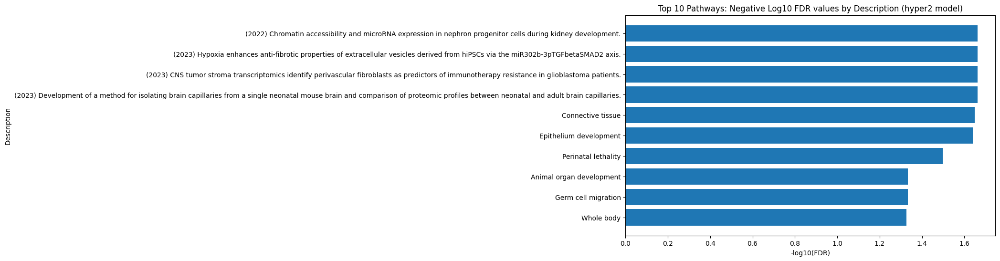

In [ ]:
# Define the gene lists
hyper2_genes = ['Six2', 'Col3a1', 'Hba-a2', 'Hbb-y', 'Hba-a1', 'Hba-x', 'Hbb-bh1', 'Glra1', 'Fbn2', 'Cnn2']
string_ids = stringdb.get_string_ids(hyper3_genes, species = 10090)   # human is 'species=9606'

# Perform pathway enrichment
enrichment_df = stringdb.get_enrichment(string_ids.queryItem, species = 10090)
enrichment_df
df = enrichment_df
sorted_df = df.sort_values(by='fdr', ascending=False)

# Select the top 10 pathways to visualise
top_10_pathways = sorted_df['description'].head(10)

print("Top 10 Pathways:")
print(top_10_pathways)

# Plotting negative log10 of FDR values against description to discern most significant pathways
plt.figure(figsize=(10, 6))
plt.barh(sorted_df['description'].head(10), -1 * sorted_df['fdr'].head(10).apply(lambda x: math.log10(x)))
plt.xlabel('-log10(FDR)')
plt.ylabel('Description')
plt.title('Top 10 Pathways: Negative Log10 FDR values by Description (hyper2 model)')
plt.show()


Top 10 Pathways:
14                                            Whole body
8                                    Germ cell migration
9                               Animal organ development
119                                  Perinatal lethality
7                                 Epithelium development
13                                     Connective tissue
111    (2023) Development of a method for isolating b...
112    (2023) CNS tumor stroma transcriptomics identi...
113    (2023) Hypoxia enhances anti-fibrotic properti...
114    (2022) Chromatin accessibility and microRNA ex...
Name: description, dtype: object


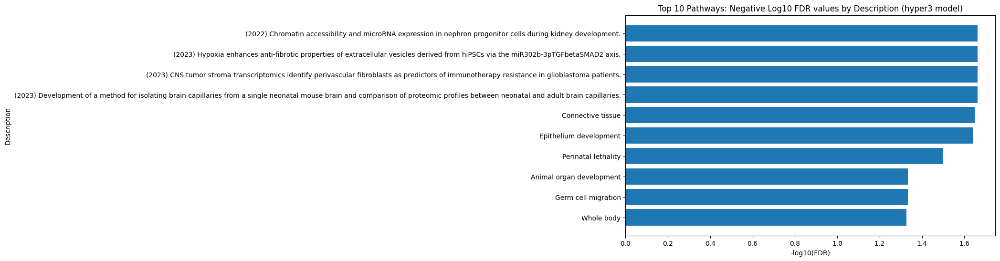

In [ ]:
# Define the gene lists
hyper3_genes = ['Six2', 'Tagln', 'Sparc', 'Tgfbi', 'Col26a1', 'Foxp2', 'Foxc1', 'Vcan', 'Cxcl12', 'Col1a2']
string_ids = stringdb.get_string_ids(hyper3_genes, species = 10090)   # human is 'species=9606'

# Perform pathway enrichment
enrichment_df = stringdb.get_enrichment(string_ids.queryItem, species = 10090)
enrichment_df
df = enrichment_df
sorted_df = df.sort_values(by='fdr', ascending=False)

# Select the top 10 pathways to visualise
top_10_pathways = sorted_df['description'].head(10)

print("Top 10 Pathways:")
print(top_10_pathways)

# Plotting negative log10 of FDR values against description to discern most significant pathways
plt.figure(figsize=(10, 6))
plt.barh(sorted_df['description'].head(10), -1 * sorted_df['fdr'].head(10).apply(lambda x: math.log10(x)))
plt.xlabel('-log10(FDR)')
plt.ylabel('Description')
plt.title('Top 10 Pathways: Negative Log10 FDR values by Description (hyper3 model)')
plt.show()


## enrichr


In [ ]:
# installing enrichrpy
!pip install enrichrpy

  Preparing metadata (setup.py) ... done
  Created wheel for enrichrpy: filename=enrichrpy-0.1.0-py3-none-any.whl size=4955 sha256=25fa997d90d87d9057299f60f09019eef27d0e5549e78141a86c0939d28de556
  Stored in directory: /root/.cache/pip/wheels/c9/56/30/81b7cfb2669958606d5e0c89926b95719292fd5dbba044a656
Successfully built enrichrpy


In [ ]:
import enrichrpy.enrichr as een
import enrichrpy.plotting as epl

In [ ]:
sorted(een.get_enrichr_libraries(names_only=True))

['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues',
 'Achilles_fitness_decrease',
 'Achilles_fitness_increase',
 'Aging_Perturbations_from_GEO_down',
 'Aging_Perturbations_from_GEO_up',
 'Allen_Brain_Atlas_10x_scRNA_2021',
 'Allen_Brain_Atlas_down',
 'Allen_Brain_Atlas_up',
 'Azimuth_2023',
 'Azimuth_Cell_Types_2021',
 'BioCarta_2013',
 'BioCarta_2015',
 'BioCarta_2016',
 'BioPlanet_2019',
 'BioPlex_2017',
 'CCLE_Proteomics_2020',
 'CORUM',
 'COVID-19_Related_Gene_Sets',
 'COVID-19_Related_Gene_Sets_2021',
 'Cancer_Cell_Line_Encyclopedia',
 'CellMarker_2024',
 'CellMarker_Augmented_2021',
 'ChEA_2013',
 'ChEA_2015',
 'ChEA_2016',
 'ChEA_2022',
 'Chromosome_Location',
 'Chromosome_Location_hg19',
 'ClinVar_2019',
 'DGIdb_Drug_Targets_2024',
 'DSigDB',
 'Data_Acquisition_Method_Most_Popular_Genes',
 'DepMap_CRISPR_GeneDependency_CellLines_2023',
 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019',
 'DepMap_WG_CRISPR_Screens_Sanger_Cell

In [ ]:
#Example model gene sets: lr=0.05, beta=0.0005
eg_genes = ["Six2", "Col3a1", "Col1a2", "Vcan", "Gpc3", "Lgals1", "Fbn2", "Rbp1", "Col4a1", "Cxcl12"]

In [ ]:
df = een.get_pathway_enrichment(eg_genes, gene_set_library='GO_Biological_Process_2023')
df

,Rank,Term name,P-value,Z-score,Combined score,Overlapping genes,Adjusted p-value,Old p-value,Old adjusted p-value
0,1,Extracellular Structure Organization (GO:0043062),0.000018,80.393531,876.646110,"[COL3A1, COL1A2, COL4A1]",0.001549,0,0
1,2,External Encapsulating Structure Organization ...,0.000019,79.638184,866.228301,"[COL3A1, COL1A2, COL4A1]",0.001549,0,0
2,3,Extracellular Matrix Organization (GO:0030198),0.000077,49.092486,465.104770,"[COL3A1, COL1A2, COL4A1]",0.004199,0,0
3,4,Collagen Fibril Organization (GO:0030199),0.000192,124.687500,1067.290863,"[COL3A1, COL1A2]",0.006904,0,0
4,5,Embryonic Organ Morphogenesis (GO:0048562),0.000210,118.738095,1005.249888,"[FBN2, SIX2]",0.006904,0,0
...,...,...,...,...,...,...,...,...,...
159,160,Positive Regulation Of Cellular Process (GO:00...,0.260342,3.634439,4.891072,[CXCL12],0.266851,0,0
160,161,Regulation Of Apoptotic Process (GO:0042981),0.301587,3.043876,3.648687,[LGALS1],0.307206,0,0
161,162,Protein Modification Process (GO:0036211),0.303756,3.017214,3.595103,[COL3A1],0.307506,0,0
162,163,Regulation Of DNA-templated Transcription (GO:...,0.636000,1.045115,0.472973,[SIX2],0.639902,0,0


In [ ]:
epl.enrichment_dotplot(df, n=20, hue='Z-score', log=True)

alt.LayerChart(...)

In [ ]:
# hyper1 gene sets: lr=0.1, beta= 0.0001
genes_hyper1 = ["Six2", "Sulf1", "Igsf3", "Arhgap1", "Synpo", "Tgfbi", "Sparc", "Pkdcc", "Anxa2", "Elk3"]

In [ ]:
df = een.get_pathway_enrichment(genes_hyper1, gene_set_library='GO_Biological_Process_2023')
df

,Rank,Term name,P-value,Z-score,Combined score,Overlapping genes,Adjusted p-value,Old p-value,Old adjusted p-value
0,1,Embryonic Digestive Tract Development (GO:0048...,0.000038,293.720588,2987.148937,"[PKDCC, SIX2]",0.005171,0,0
1,2,Negative Regulation Of Endothelial Cell Prolif...,0.000148,142.535714,1256.480728,"[SPARC, SULF1]",0.010021,0,0
2,3,Renal System Development (GO:0072001),0.000366,88.991071,704.073961,"[SIX2, SULF1]",0.014520,0,0
3,4,Negative Regulation Of Epithelial Cell Prolife...,0.000534,73.242647,551.944023,"[SPARC, SULF1]",0.014520,0,0
4,5,Kidney Development (GO:0001822),0.000549,72.177536,541.874418,"[SIX2, SULF1]",0.014520,0,0
...,...,...,...,...,...,...,...,...,...
130,131,Positive Regulation Of Cell Population Prolife...,0.216919,4.497003,6.872462,[SIX2],0.223542,0,0
131,132,Protein Phosphorylation (GO:0006468),0.223715,4.340013,6.498664,[PKDCC],0.228799,0,0
132,133,Negative Regulation Of Cellular Process (GO:00...,0.238322,4.032753,5.783495,[TGFBI],0.241906,0,0
133,134,Regulation Of DNA-templated Transcription (GO:...,0.248815,2.352865,3.272942,"[SIX2, ELK3]",0.250672,0,0


In [ ]:
epl.enrichment_dotplot(df, n=20, hue='Z-score', log=True)

alt.LayerChart(...)

In [ ]:
# hyper2 gene sets: lr=0.1, beta= 5e-05
genes_hyper2 = ['Six2', 'Col3a1', 'Hba-a2', 'Hbb-y', 'Hba-a1', 'Hba-x', 'Hbb-bh1', 'Glra1', 'Fbn2', 'Cnn2']

In [ ]:
df = een.get_pathway_enrichment(genes_hyper2, gene_set_library='GO_Biological_Process_2023')
df

,Rank,Term name,P-value,Z-score,Combined score,Overlapping genes,Adjusted p-value,Old p-value,Old adjusted p-value
0,1,Embryonic Organ Morphogenesis (GO:0048562),0.000210,118.738095,1005.249888,"[FBN2, SIX2]",0.021048,0,0
1,2,Mesenchymal Cell Differentiation Involved In K...,0.002498,555.166667,3326.770642,[SIX2],0.022459,0,0
2,3,Mesenchymal To Epithelial Transition Involved ...,0.002498,555.166667,3326.770642,[SIX2],0.022459,0,0
3,4,Mesodermal Cell Fate Commitment (GO:0001710),0.002498,555.166667,3326.770642,[SIX2],0.022459,0,0
4,5,Regulation Of Morphogenesis Of A Branching Str...,0.002498,555.166667,3326.770642,[SIX2],0.022459,0,0
...,...,...,...,...,...,...,...,...,...
95,96,Organelle Organization (GO:0006996),0.190438,5.215294,8.649180,[CNN2],0.198373,0,0
96,97,Positive Regulation Of Cell Population Prolife...,0.216919,4.497003,6.872462,[SIX2],0.223628,0,0
97,98,Protein Modification Process (GO:0036211),0.303756,3.017214,3.595103,[COL3A1],0.309955,0,0
98,99,Regulation Of DNA-templated Transcription (GO:...,0.636000,1.045115,0.472973,[SIX2],0.642425,0,0


In [ ]:
epl.enrichment_dotplot(df, n=20, hue='Z-score', log=True)

alt.LayerChart(...)

In [ ]:
# hyper3 gene sets: lr=0.1, beta= 5e-05
genes_hyper3 = ['Six2', 'Tagln', 'Sparc', 'Tgfbi', 'Col26a1', 'Foxp2', 'Foxc1', 'Vcan', 'Cxcl12', 'Col1a2']

In [ ]:
df = een.get_pathway_enrichment(genes_hyper3, gene_set_library='GO_Biological_Process_2023')
df

,Rank,Term name,P-value,Z-score,Combined score,Overlapping genes,Adjusted p-value,Old p-value,Old adjusted p-value
0,1,Response To Chemokine (GO:1990868),0.000017,454.068182,4973.589533,"[FOXC1, CXCL12]",0.002555,0,0
1,2,Odontogenesis (GO:0042476),0.000165,134.817568,1174.129027,"[FOXC1, COL1A2]",0.011072,0,0
2,3,Chemokine-Mediated Signaling Pathway (GO:0070098),0.000354,90.613636,720.066869,"[FOXC1, CXCL12]",0.011072,0,0
3,4,Renal System Development (GO:0072001),0.000366,88.991071,704.073961,"[FOXC1, SIX2]",0.011072,0,0
4,5,Cellular Response To Chemokine (GO:1990869),0.000379,87.425439,688.695418,"[FOXC1, CXCL12]",0.011072,0,0
...,...,...,...,...,...,...,...,...,...
141,142,Positive Regulation Of Cellular Process (GO:00...,0.260342,3.634439,4.891072,[CXCL12],0.267676,0,0
142,143,Negative Regulation Of Transcription By RNA Po...,0.322304,2.803733,3.174557,[FOXC1],0.329065,0,0
143,144,Positive Regulation Of Transcription By RNA Po...,0.381504,2.259338,2.177176,[FOXC1],0.386803,0,0
144,145,Regulation Of Gene Expression (GO:0010468),0.440176,1.861456,1.527475,[FOXC1],0.443212,0,0


In [ ]:
epl.enrichment_dotplot(df, n=20, hue='Z-score', log=True)

alt.LayerChart(...)

# Uncovering the spatial distribution of different model genes using Scanpy&Squidpy

In [ ]:
!pip install squidpy

In [ ]:
!pip install anndata

In [ ]:
!pip install igraph

In [ ]:
import numpy as np
import pandas as pd

import anndata as ad
import scanpy as sc
import squidpy as sq

sc.logging.print_header()
print(f"squidpy=={sq.__version__}")


scanpy==1.10.2 anndata==0.10.8 umap==0.5.6 numpy==1.24.4 scipy==1.14.0 pandas==2.2.2 scikit-learn==1.3.2 statsmodels==0.13.5 igraph==0.11.6 pynndescent==0.5.13
squidpy==1.6.0


In [ ]:
# # Download the DBiT-seq dataset suitable for this workshop
# !gdown  1D3AIjshsAiIOktmFrvMgqKO1UKiQSPbu

# # Assemble adata object for single-cell analysis
# adata = sc.read("DBiTseq_UnitedNet.h5ad")
# adata

Downloading...
From: https://drive.google.com/uc?id=1D3AIjshsAiIOktmFrvMgqKO1UKiQSPbu
To: /content/DBiTseq_UnitedNet.h5ad
100% 2.36M/2.36M [00:00<00:00, 15.6MB/s]


AnnData object with n_obs × n_vars = 936 × 568
    obs: 'id', 'array_row', 'array_col', 'cell_type', 'batch', 'imagecol', 'imagerow', 'label', 'sample'
    var: 'gene_ids-0', 'gene_ids-1'
    obsm: 'spatial'

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import anndata as ad

# Load the anndata object
adata = ad.read_h5ad('/content/drive/MyDrive/Colab Notebooks/adatas_all_0.h5ad')

In [ ]:
adata

AnnData object with n_obs × n_vars = 936 × 568
    obs: 'id', 'array_row', 'array_col', 'cell_type', 'batch', 'imagecol', 'imagerow', 'label', 'sample', 'predict_sub', 'predict_sub_less'
    var: 'gene_ids-0', 'gene_ids-1'
    obsm: 'spatial'

In [ ]:
adata.obs

,id,array_row,array_col,cell_type,batch,imagecol,imagerow,label,sample,predict_sub,predict_sub_less
1-0,41x15,41,15,2,test,15,41,2,0,9,Cluster 9
2-0,41x16,41,16,2,test,16,41,2,0,9,Cluster 9
3-0,41x17,41,17,2,test,17,41,2,0,9,Cluster 9
6-0,41x20,41,20,2,test,20,41,2,0,0,Cluster 0
7-0,41x21,41,21,2,test,21,41,2,0,0,Cluster 0
...,...,...,...,...,...,...,...,...,...,...,...
894-1,44x28,44,28,2,test,28,44,2,1,5,Cluster 5
905-1,43x23,43,23,2,test,23,43,2,1,5,Cluster 5
922-1,42x21,42,21,2,test,21,42,2,1,0,Cluster 0
923-1,42x22,42,22,2,test,22,42,2,1,0,Cluster 0


In [ ]:
adata.var

,gene_ids-0,gene_ids-1
1810037I17Rik,0,1810037I17Rik
2410002F23Rik,1,2410002F23Rik
5730559C18Rik,2,5730559C18Rik
Aagab,3,Aagab
Aars2,4,Aars2
...,...,...
Zfp503,563,Zfp503
Zfp655,564,Zfp655
Zic1,565,Zic1
Zic3,566,Zic3


In [ ]:
adata.X

array([[-0.857054  ,  1.0702485 , -0.31106138, ...,  0.01226916,
        -0.43692327,  0.5149035 ],
       [ 1.1348248 , -0.73532856, -0.31106138, ...,  0.25244313,
        -0.43692327, -0.93672335],
       [-0.857054  ,  1.0372028 , -0.31106138, ..., -1.1496242 ,
         1.3295069 , -0.32879484],
       ...,
       [ 1.4321178 ,  0.848179  , -0.31106138, ...,  0.19559799,
         0.80403626, -0.93672335],
       [ 1.5269527 , -0.73532856, -0.31106138, ..., -1.1496242 ,
        -0.43692327, -0.93672335],
       [-0.857054  ,  1.3635658 , -0.31106138, ..., -0.32230744,
        -0.43692327, -0.93672335]], dtype=float32)

In [ ]:
import numpy as np

from scipy.sparse import issparse

if issparse(adata.X):
    # Convert sparse matrix to dense array
    dense_array = adata.X.toarray()
    has_nan = np.any(np.isnan(dense_array))
else:
    has_nan = np.any(np.isnan(adata.X))

print(f"Contains NaN: {has_nan}")

Contains NaN: False


In [ ]:
# Preprocess the dataset

sc.pp.pca(adata)
sc.pp.highly_variable_genes(adata, flavor='seurat', n_top_genes=200)

sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(
    adata, key_added="clusters", flavor="igraph", directed=False, n_iterations=2
)

In [ ]:
adata


AnnData object with n_obs × n_vars = 936 × 568
    obs: 'id', 'array_row', 'array_col', 'cell_type', 'batch', 'imagecol', 'imagerow', 'label', 'sample', 'predict_sub', 'predict_sub_less', 'clusters'
    var: 'gene_ids-0', 'gene_ids-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'hvg', 'neighbors', 'umap', 'clusters'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

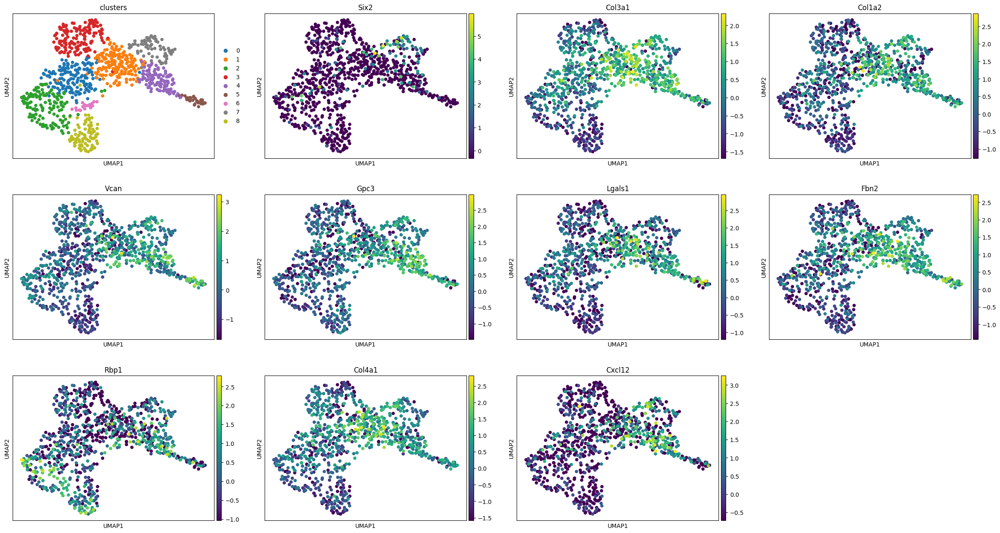

In [ ]:
# umap of the example model gene set
sc.pl.umap(adata,color= ['clusters','Six2', 'Col3a1', 'Col1a2', 'Vcan', 'Gpc3', 'Lgals1', 'Fbn2', 'Rbp1', 'Col4a1', 'Cxcl12'])

### umap


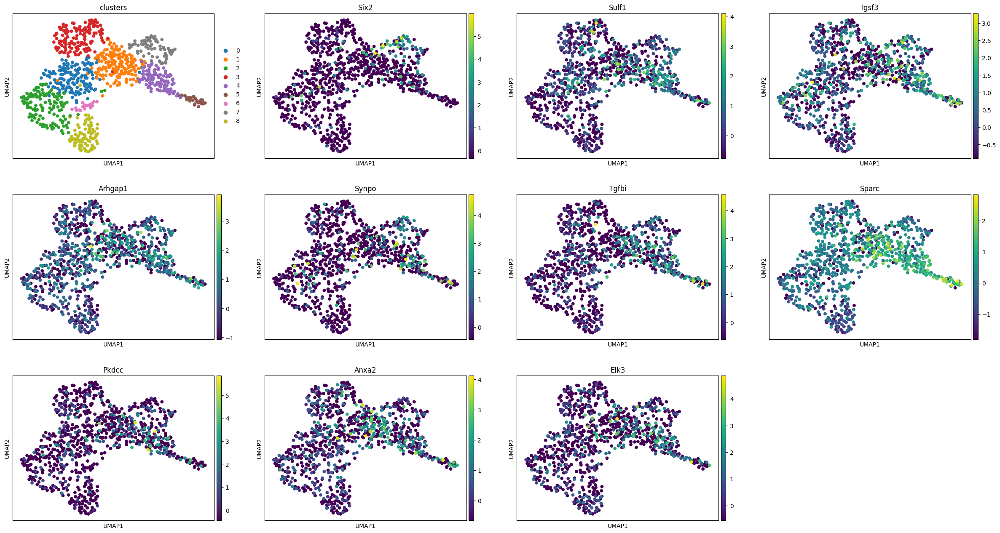

In [ ]:
# umap of the hyper1 model gene set
sc.pl.umap(adata, color=[ "clusters", 'Six2', 'Sulf1', 'Igsf3', 'Arhgap1', 'Synpo', 'Tgfbi', 'Sparc', 'Pkdcc', 'Anxa2', 'Elk3'])


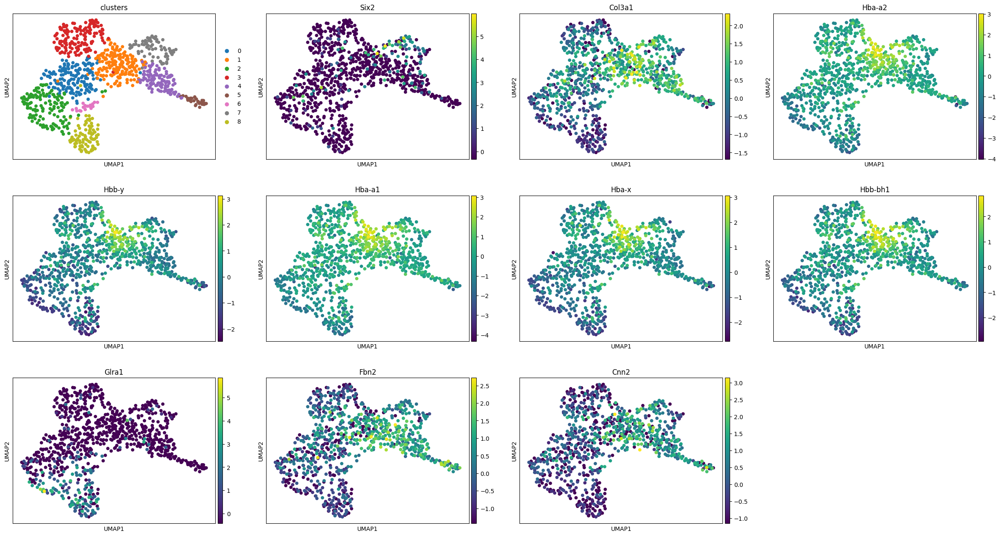

In [ ]:
# umap of the hyper2 model gene set
sc.pl.umap(adata, color=[ "clusters",'Six2', 'Col3a1', 'Hba-a2', 'Hbb-y', 'Hba-a1', 'Hba-x', 'Hbb-bh1', 'Glra1', 'Fbn2', 'Cnn2'])


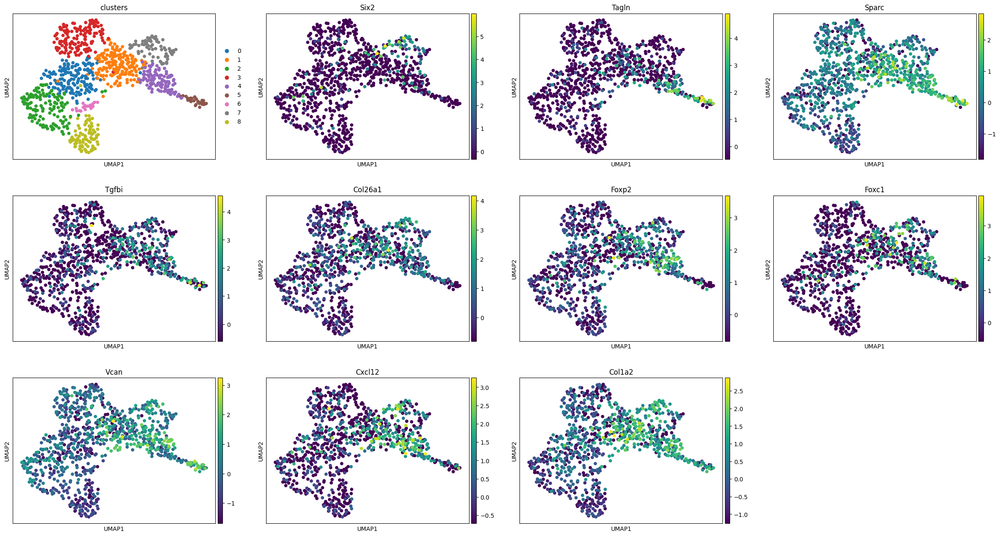

In [ ]:
# umap of the hyper3 model gene set
sc.pl.umap(adata, color=[ "clusters",'Six2', 'Tagln', 'Sparc', 'Tgfbi', 'Col26a1', 'Foxp2', 'Foxc1', 'Vcan', 'Cxcl12', 'Col1a2'])


### Spatial clusting

These are the ground-truth labels provided by the original DBiT-seq dataset
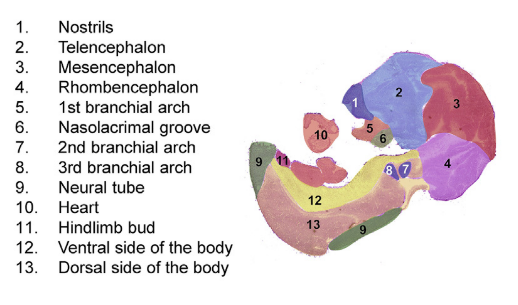

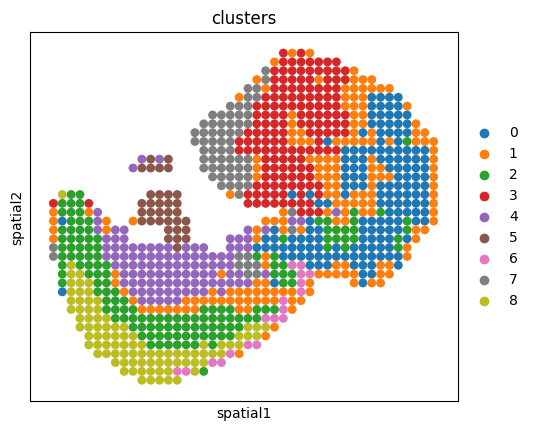

In [ ]:
sc.pl.spatial(adata, color=['clusters'], spot_size=1, cmap='tab20')

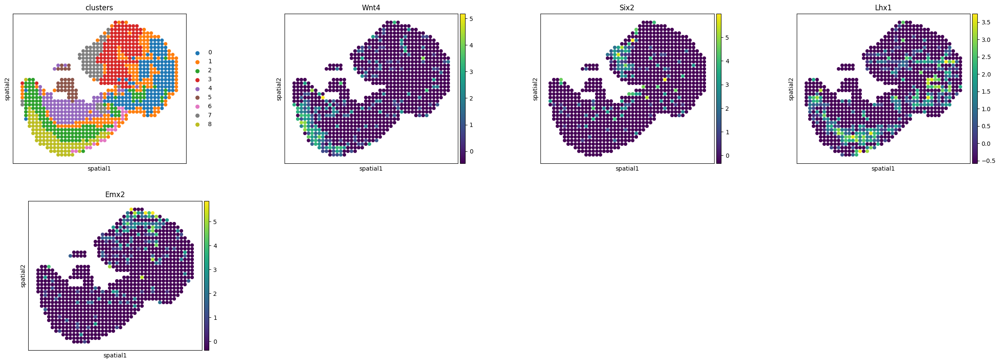

In [ ]:
## Double check these genes
# Plot kidney morphogenesis genes existing in the dataset
# show it as the ground truth
# 10.1016/j.devcel.2010.04.008
# Emx2 (Empty Spiracles Homeobox 2) is a homeobox gene that is involved in the early stages of kidney development.
# It is essential for the formation of the ureteric bud and the subsequent development of the kidney.


sc.pl.spatial(adata,spot_size=1, color=['clusters','Wnt4',"Six2",'Lhx1','Emx2'])


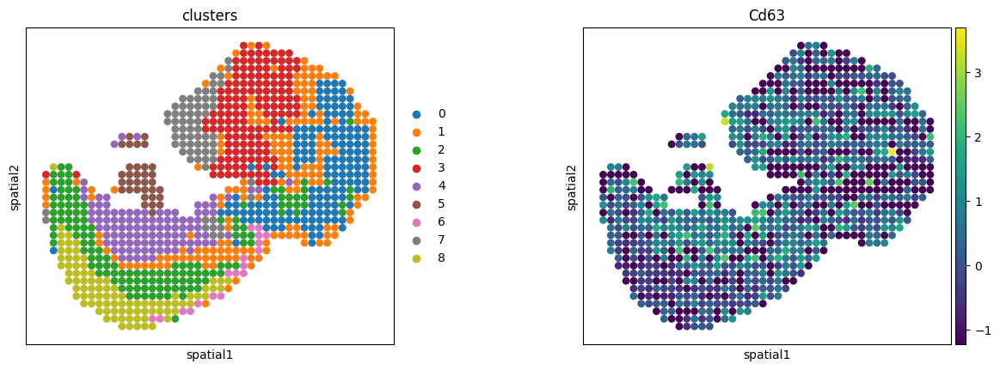

In [ ]:
## Doublecheck: plot more genes from the DBit-sep paper, Figure 2 genes

sc.pl.spatial(adata,spot_size=1, color=['clusters','Cd63'])


<ipython-input-23-0d20b6b2b5ae>:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])


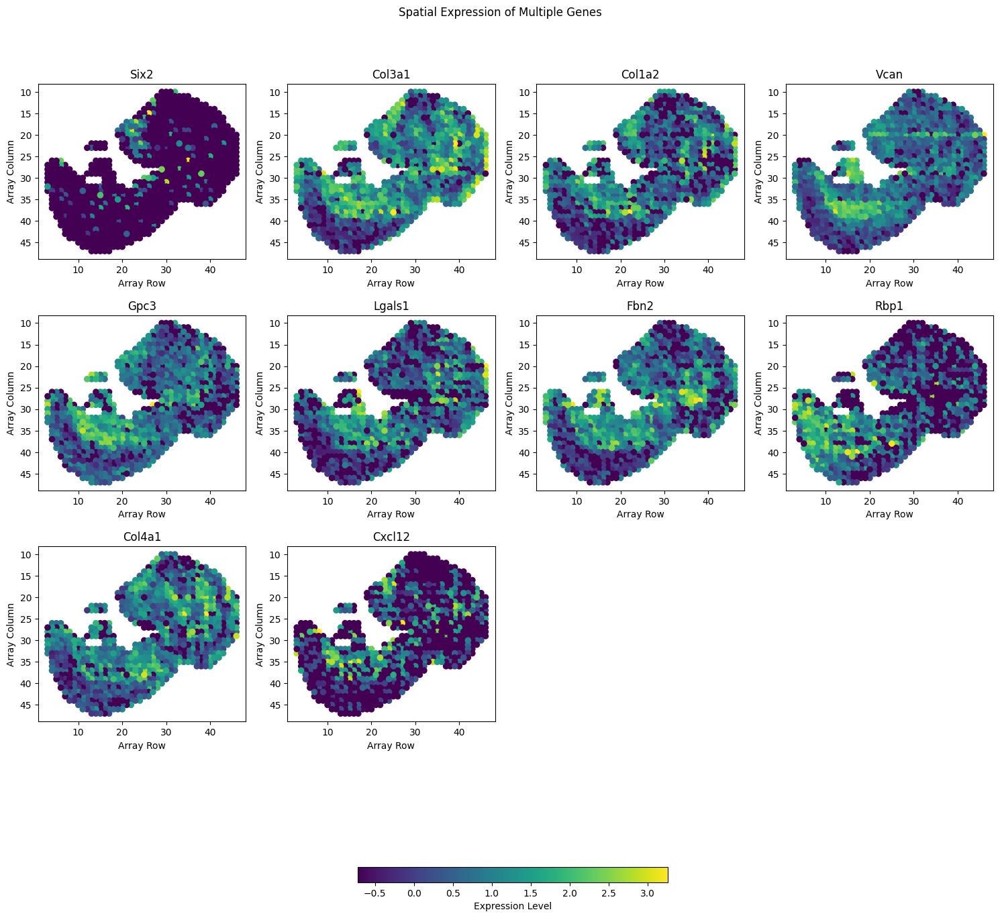

In [ ]:
import anndata as ad
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Function to plot the spatial expression of multiple genes in a grid
def plot_multiple_genes(adata, gene_list):
    # Check if all genes are present in the dataset
    missing_genes = [gene for gene in gene_list if gene not in adata.var_names]
    if missing_genes:
        print(f"The following genes were not found in the dataset: {', '.join(missing_genes)}")
        gene_list = [gene for gene in gene_list if gene in adata.var_names]

    # Calculate grid size
    n_genes = len(gene_list)
    grid_size = int(np.ceil(np.sqrt(n_genes)))

    fig, axs = plt.subplots(grid_size, grid_size, figsize=(15, 15))
    axs = axs.flatten()

    for i, gene in enumerate(gene_list):
        gene_expression = adata[:, gene].X.toarray().flatten()
        sc = axs[i].scatter(adata.obs['array_row'], adata.obs['array_col'], c=gene_expression, cmap='viridis', s=35)
        axs[i].set_title(f'{gene}')
        axs[i].invert_yaxis()
        axs[i].set_xlabel('Array Row')
        axs[i].set_ylabel('Array Column')

    # Remove empty subplots
    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])

    plt.colorbar(sc, ax=axs, orientation='horizontal', fraction=0.02, pad=0.04, label='Expression Level')
    plt.suptitle('Spatial Expression of Multiple Genes')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# example model gene list
gene_list = ['Six2', 'Col3a1', 'Col1a2', 'Vcan', 'Gpc3', 'Lgals1', 'Fbn2', 'Rbp1', 'Col4a1', 'Cxcl12']
plot_multiple_genes(adata, gene_list)

<ipython-input-24-26b0731761a9>:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])


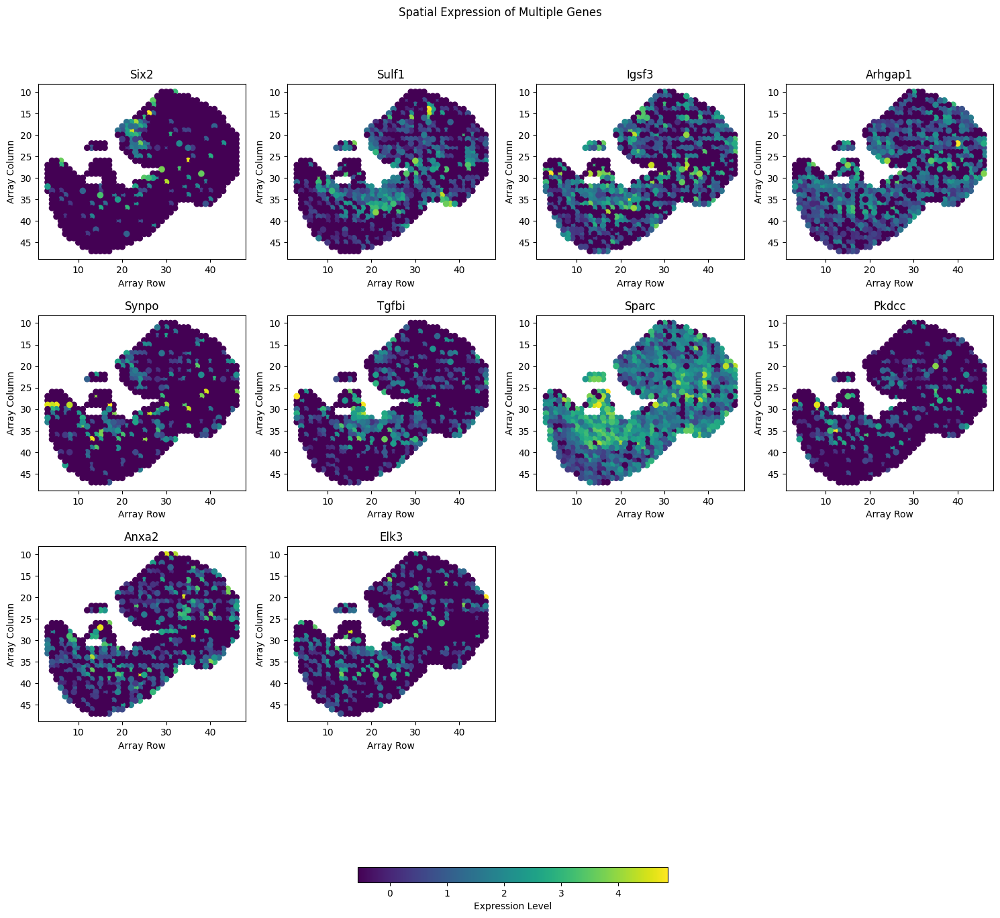

In [ ]:
import anndata as ad
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Function to plot the spatial expression of multiple genes in a grid
def plot_multiple_genes(adata, gene_list):
    # Check if all genes are present in the dataset
    missing_genes = [gene for gene in gene_list if gene not in adata.var_names]
    if missing_genes:
        print(f"The following genes were not found in the dataset: {', '.join(missing_genes)}")
        gene_list = [gene for gene in gene_list if gene in adata.var_names]

    # Calculate grid size
    n_genes = len(gene_list)
    grid_size = int(np.ceil(np.sqrt(n_genes)))

    fig, axs = plt.subplots(grid_size, grid_size, figsize=(15, 15))
    axs = axs.flatten()

    for i, gene in enumerate(gene_list):
        gene_expression = adata[:, gene].X.toarray().flatten()
        sc = axs[i].scatter(adata.obs['array_row'], adata.obs['array_col'], c=gene_expression, cmap='viridis', s=35)
        axs[i].set_title(f'{gene}')
        axs[i].invert_yaxis()
        axs[i].set_xlabel('Array Row')
        axs[i].set_ylabel('Array Column')

    # Remove empty subplots
    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])

    plt.colorbar(sc, ax=axs, orientation='horizontal', fraction=0.02, pad=0.04, label='Expression Level')
    plt.suptitle('Spatial Expression of Multiple Genes')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# hyper1 gene list
gene_list = ['Six2', 'Sulf1', 'Igsf3', 'Arhgap1', 'Synpo', 'Tgfbi', 'Sparc', 'Pkdcc', 'Anxa2', 'Elk3']
plot_multiple_genes(adata, gene_list)

<ipython-input-25-e58c218348d1>:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])


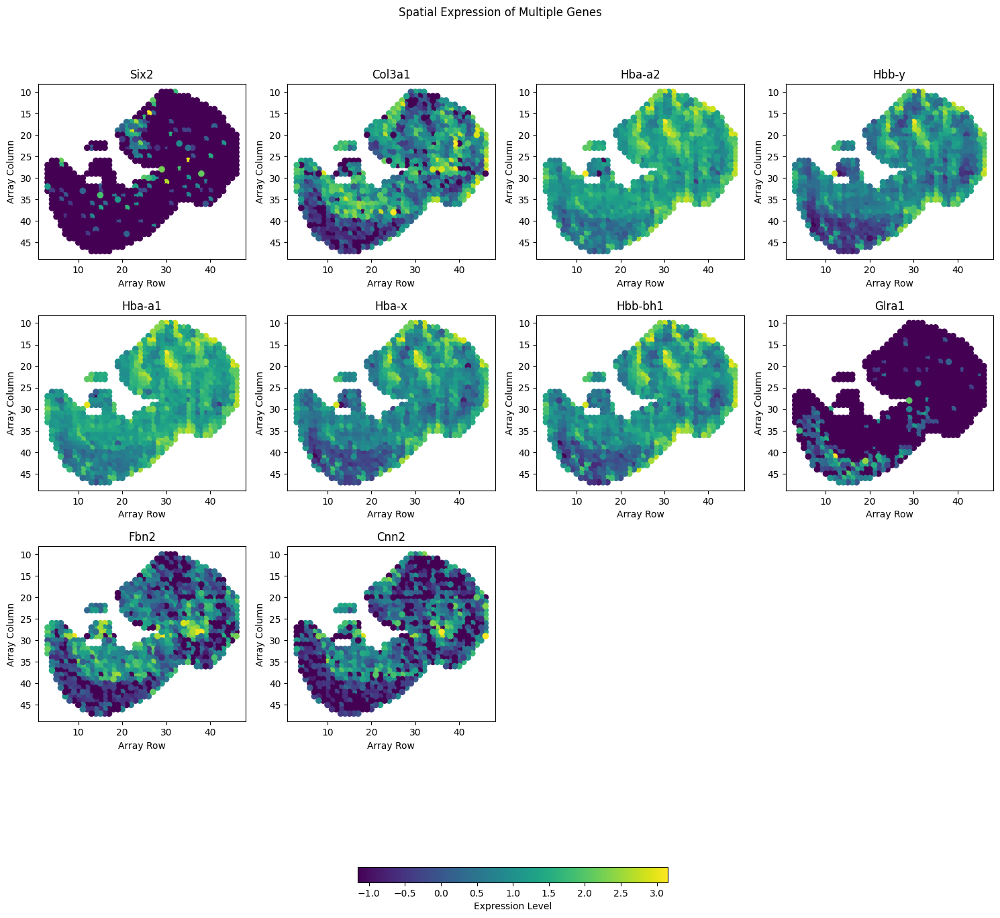

In [ ]:
import anndata as ad
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Function to plot the spatial expression of multiple genes in a grid
def plot_multiple_genes(adata, gene_list):
    # Check if all genes are present in the dataset
    missing_genes = [gene for gene in gene_list if gene not in adata.var_names]
    if missing_genes:
        print(f"The following genes were not found in the dataset: {', '.join(missing_genes)}")
        gene_list = [gene for gene in gene_list if gene in adata.var_names]

    # Calculate grid size
    n_genes = len(gene_list)
    grid_size = int(np.ceil(np.sqrt(n_genes)))

    fig, axs = plt.subplots(grid_size, grid_size, figsize=(15, 15))
    axs = axs.flatten()

    for i, gene in enumerate(gene_list):
        gene_expression = adata[:, gene].X.toarray().flatten()
        sc = axs[i].scatter(adata.obs['array_row'], adata.obs['array_col'], c=gene_expression, cmap='viridis', s=35)
        axs[i].set_title(f'{gene}')
        axs[i].invert_yaxis()
        axs[i].set_xlabel('Array Row')
        axs[i].set_ylabel('Array Column')

    # Remove empty subplots
    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])

    plt.colorbar(sc, ax=axs, orientation='horizontal', fraction=0.02, pad=0.04, label='Expression Level')
    plt.suptitle('Spatial Expression of Multiple Genes')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# hyper2 gene list
gene_list = ['Six2', 'Col3a1', 'Hba-a2', 'Hbb-y', 'Hba-a1', 'Hba-x', 'Hbb-bh1', 'Glra1', 'Fbn2', 'Cnn2']
plot_multiple_genes(adata, gene_list)

<ipython-input-26-25fea21154c2>:36: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])


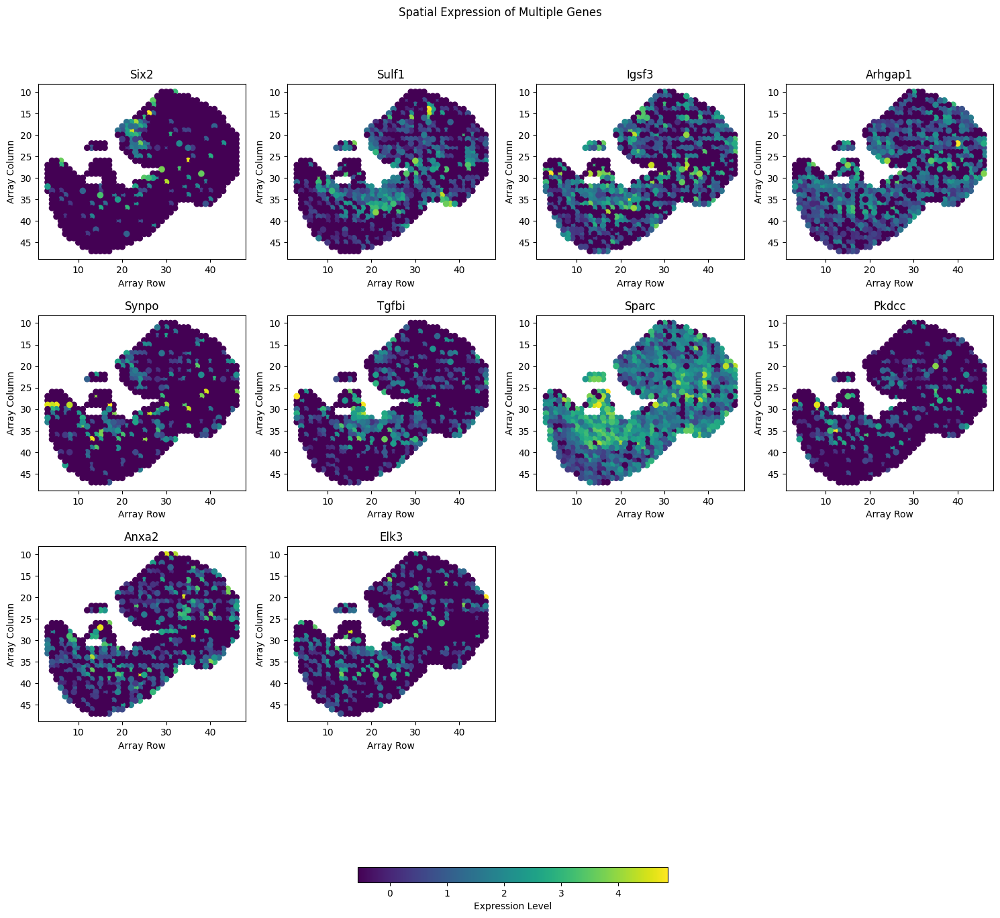

In [ ]:
import anndata as ad
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Function to plot the spatial expression of multiple genes in a grid
def plot_multiple_genes(adata, gene_list):
    # Check if all genes are present in the dataset
    missing_genes = [gene for gene in gene_list if gene not in adata.var_names]
    if missing_genes:
        print(f"The following genes were not found in the dataset: {', '.join(missing_genes)}")
        gene_list = [gene for gene in gene_list if gene in adata.var_names]

    # Calculate grid size
    n_genes = len(gene_list)
    grid_size = int(np.ceil(np.sqrt(n_genes)))

    fig, axs = plt.subplots(grid_size, grid_size, figsize=(15, 15))
    axs = axs.flatten()

    for i, gene in enumerate(gene_list):
        gene_expression = adata[:, gene].X.toarray().flatten()
        sc = axs[i].scatter(adata.obs['array_row'], adata.obs['array_col'], c=gene_expression, cmap='viridis', s=35) # Comment: Relate to Mongose
        axs[i].set_title(f'{gene}')
        axs[i].invert_yaxis()
        axs[i].set_xlabel('Array Row')
        axs[i].set_ylabel('Array Column')

    # Remove empty subplots
    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])

    plt.colorbar(sc, ax=axs, orientation='horizontal', fraction=0.02, pad=0.04, label='Expression Level')
    plt.suptitle('Spatial Expression of Multiple Genes')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Example usage with hyper3 gene list
gene_list = ['Six2', 'Sulf1', 'Igsf3', 'Arhgap1', 'Synpo', 'Tgfbi', 'Sparc', 'Pkdcc', 'Anxa2', 'Elk3']
plot_multiple_genes(adata, gene_list)

### Scanpy matrix plot

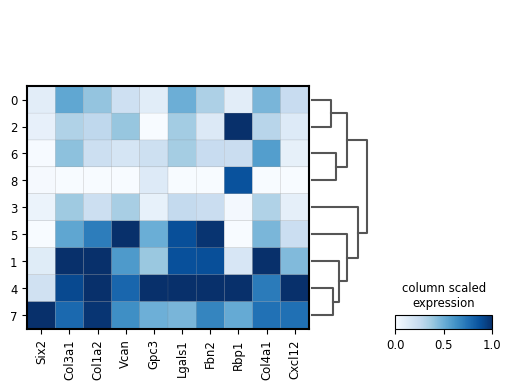

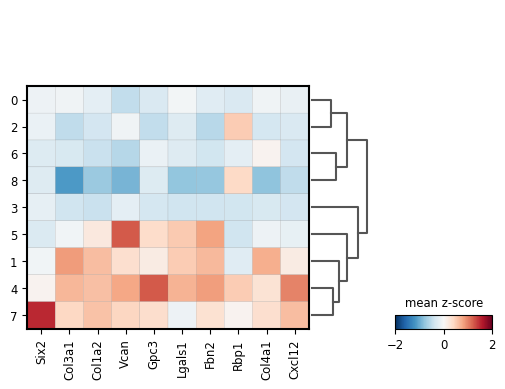

In [ ]:
example_genes_list = ['Six2', 'Col3a1', 'Col1a2', 'Vcan', 'Gpc3', 'Lgals1', 'Fbn2', 'Rbp1', 'Col4a1', 'Cxcl12']

sc.pl.matrixplot(
    adata,
    example_genes_list,
    "clusters",
    dendrogram=True,
    cmap="Blues",
    standard_scale="var",
    colorbar_title="column scaled\nexpression",
)

adata.layers["scaled"] = sc.pp.scale(adata, copy=True).X

sc.pl.matrixplot(
    adata,
    example_genes_list,
    "clusters",
    dendrogram=True,
    colorbar_title="mean z-score",
    layer="scaled",
    vmin=-2,
    vmax=2,
    cmap="RdBu_r",
)

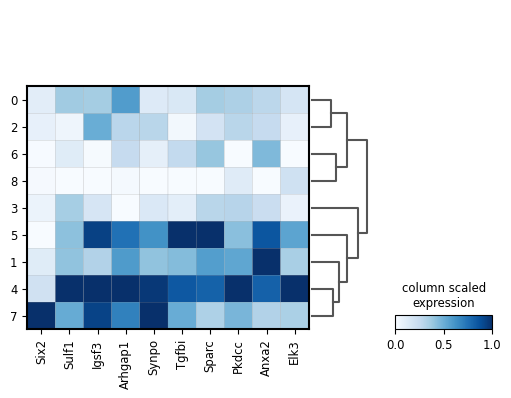

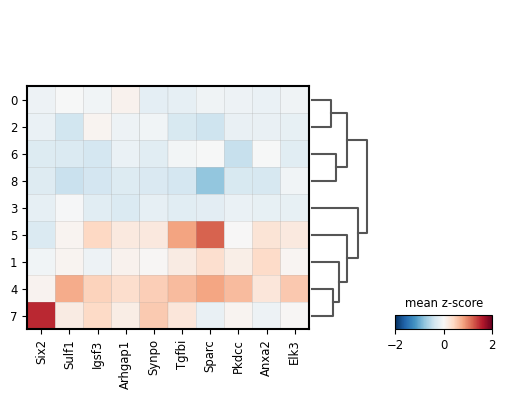

In [ ]:
hyper1_genes_list = ['Six2', 'Sulf1', 'Igsf3', 'Arhgap1', 'Synpo', 'Tgfbi', 'Sparc', 'Pkdcc', 'Anxa2', 'Elk3']

sc.pl.matrixplot(
    adata,
    hyper1_genes_list,
    "clusters",
    dendrogram=True,
    cmap="Blues",
    standard_scale="var",
    colorbar_title="column scaled\nexpression",
)

sc.pl.matrixplot(
    adata,
    hyper1_genes_list,
    "clusters",
    dendrogram=True,
    colorbar_title="mean z-score",
    layer="scaled",
    vmin=-2,
    vmax=2,
    cmap="RdBu_r",
)

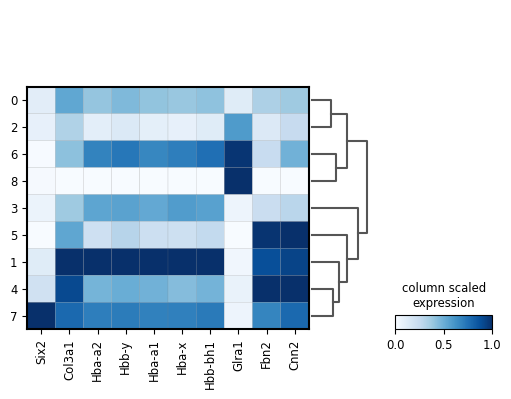

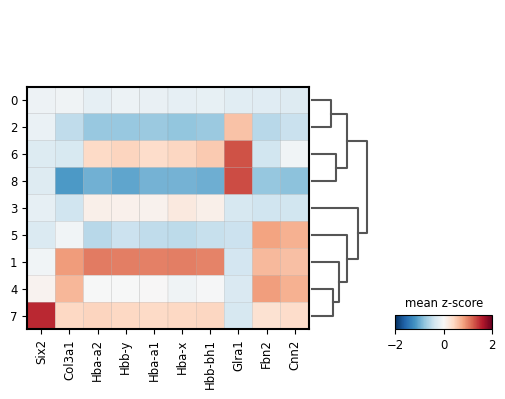

In [ ]:
hyper2_genes_list= ['Six2', 'Col3a1', 'Hba-a2', 'Hbb-y', 'Hba-a1', 'Hba-x', 'Hbb-bh1', 'Glra1', 'Fbn2', 'Cnn2']

sc.pl.matrixplot(
    adata,
    hyper2_genes_list,
    "clusters",
    dendrogram=True,
    cmap="Blues",
    standard_scale="var",
    colorbar_title="column scaled\nexpression",
)

sc.pl.matrixplot(
    adata,
    hyper2_genes_list,
    "clusters",
    dendrogram=True,
    colorbar_title="mean z-score",
    layer="scaled",
    vmin=-2,
    vmax=2,
    cmap="RdBu_r",
)

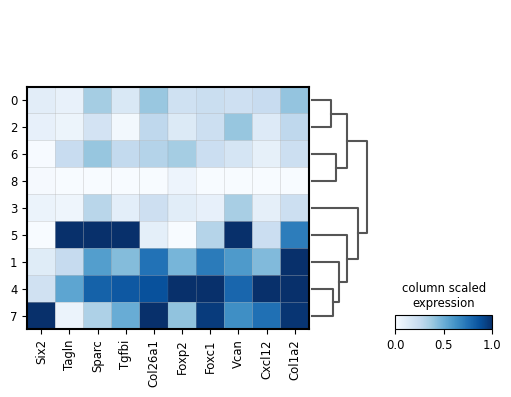

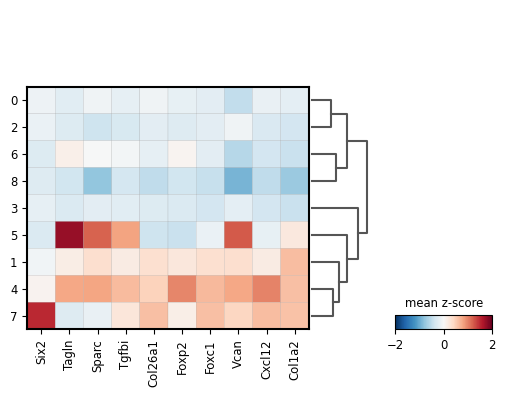

In [ ]:
hyper3_genes_list= ['Six2', 'Tagln', 'Sparc', 'Tgfbi', 'Col26a1', 'Foxp2', 'Foxc1', 'Vcan', 'Cxcl12', 'Col1a2']

sc.pl.matrixplot(
    adata,
    hyper3_genes_list,
    "clusters",
    dendrogram=True,
    cmap="Blues",
    standard_scale="var",
    colorbar_title="column scaled\nexpression",
)

sc.pl.matrixplot(
    adata,
    hyper3_genes_list,
    "clusters",
    dendrogram=True,
    colorbar_title="mean z-score",
    layer="scaled",
    vmin=-2,
    vmax=2,
    cmap="RdBu_r",
)

### heatmap

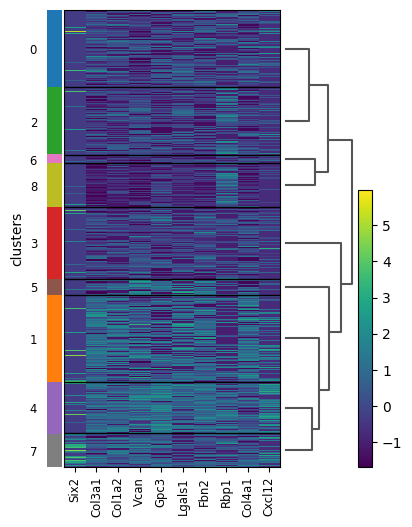

In [ ]:
 ax = sc.pl.heatmap(
    adata, example_genes_list, groupby="clusters", cmap="viridis", dendrogram=True
)

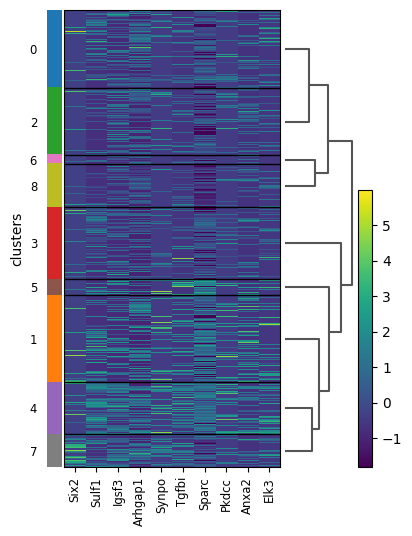

In [ ]:
 ax = sc.pl.heatmap(
    adata, hyper1_genes_list, groupby="clusters", cmap="viridis", dendrogram=True
)

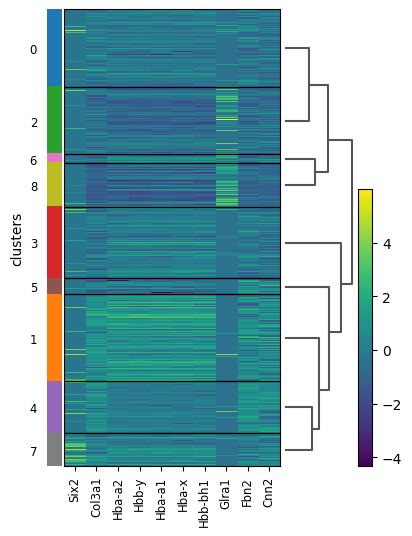

In [ ]:
 ax = sc.pl.heatmap(
    adata, hyper2_genes_list, groupby="clusters", cmap="viridis", dendrogram=True
)

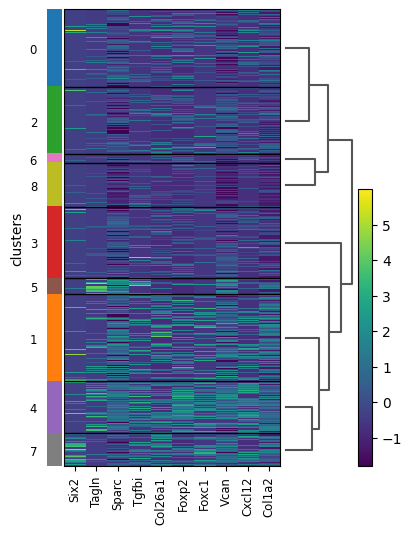

In [ ]:
 ax = sc.pl.heatmap(
    adata, hyper3_genes_list, groupby="clusters", cmap="viridis", dendrogram=True
)

## Using Moran's I statistics to find genes that show spatial patterns


In [ ]:
# calculate spatial_connectivities in the dataset first

sq.gr.spatial_neighbors(adata)

In [ ]:
adata

# Now, we have 'spatial_connectivities' in adata.obsp

AnnData object with n_obs × n_vars = 936 × 568
    obs: 'id', 'array_row', 'array_col', 'cell_type', 'batch', 'imagecol', 'imagerow', 'label', 'sample', 'predict_sub', 'predict_sub_less', 'clusters'
    var: 'gene_ids-0', 'gene_ids-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'hvg', 'neighbors', 'umap', 'clusters', 'clusters_colors', 'dendrogram_clusters', 'spatial_neighbors'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'scaled'
    obsp: 'distances', 'connectivities', 'spatial_connectivities', 'spatial_distances'

In [ ]:
# List of genes of interest
genes_of_interest_example = ['Six2', 'Col3a1', 'Col1a2', 'Vcan', 'Gpc3', 'Lgals1', 'Fbn2', 'Rbp1', 'Col4a1', 'Cxcl12']

# Calculate Moran's I for these genes
sq.gr.spatial_autocorr(adata, mode='moran', genes=genes_of_interest_example)

In [ ]:
adata.uns["moranI"].head(10)

,I,pval_norm,var_norm,pval_norm_fdr_bh
Col3a1,0.447410,0.0,0.000321,0.0
Fbn2,0.431344,0.0,0.000321,0.0
Vcan,0.426047,0.0,0.000321,0.0
Rbp1,0.377168,0.0,0.000321,0.0
Gpc3,0.340346,0.0,0.000321,0.0
Col4a1,0.295851,0.0,0.000321,0.0
Lgals1,0.283670,0.0,0.000321,0.0
Col1a2,0.257242,0.0,0.000321,0.0
Cxcl12,0.239783,0.0,0.000321,0.0
Six2,0.213173,0.0,0.000321,0.0


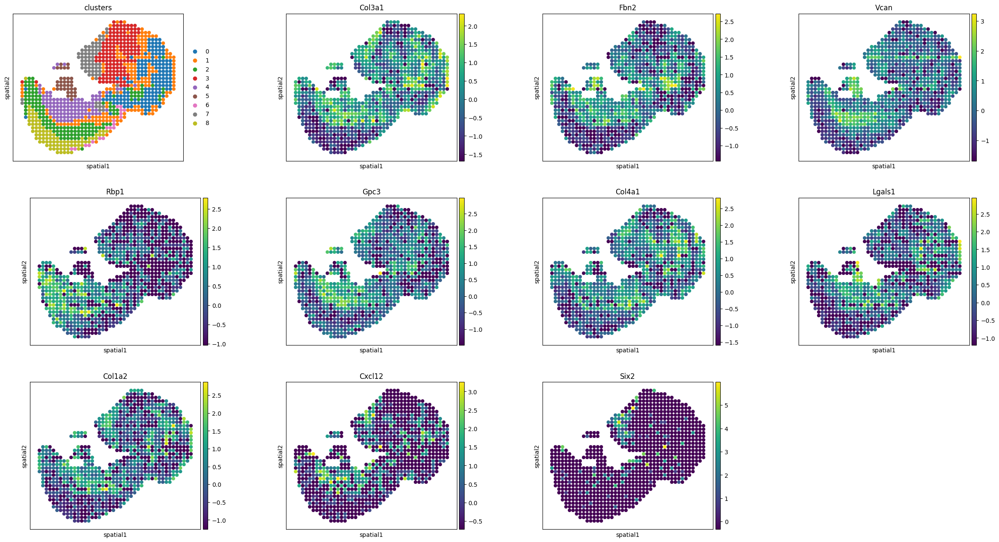

In [ ]:
sc.pl.spatial(adata, spot_size=1, color=["clusters",
                                         "Col3a1",
                                         "Fbn2",
                                         "Vcan",
                                         "Rbp1",
                                         "Gpc3",
                                         "Col4a1",
                                         "Lgals1",
                                         "Col1a2",
                                         "Cxcl12",
                                         "Six2"])

In [ ]:
# hyper1 gene list
genes_of_interest_hyper1 = ['Six2', 'Sulf1', 'Igsf3', 'Arhgap1', 'Synpo', 'Tgfbi', 'Sparc', 'Pkdcc', 'Anxa2', 'Elk3']

# Calculate Moran's I for these genes
sq.gr.spatial_autocorr(adata, mode='moran', genes=genes_of_interest_hyper1)

In [ ]:
adata.uns["moranI"].head(10)

,I,pval_norm,var_norm,pval_norm_fdr_bh
Sulf1,0.258003,0.000000e+00,0.000321,0.000000e+00
Sparc,0.247551,0.000000e+00,0.000321,0.000000e+00
Six2,0.213173,0.000000e+00,0.000321,0.000000e+00
Tgfbi,0.188715,0.000000e+00,0.000321,0.000000e+00
Igsf3,0.110272,2.635262e-10,0.000321,5.270524e-10
Synpo,0.104902,1.697022e-09,0.000321,2.828370e-09
Pkdcc,0.059116,3.936037e-04,0.000321,5.622909e-04
Elk3,0.047230,3.527350e-03,0.000321,4.409188e-03
Anxa2,0.042748,7.258483e-03,0.000321,8.064981e-03
Arhgap1,0.039394,1.200050e-02,0.000321,1.200050e-02


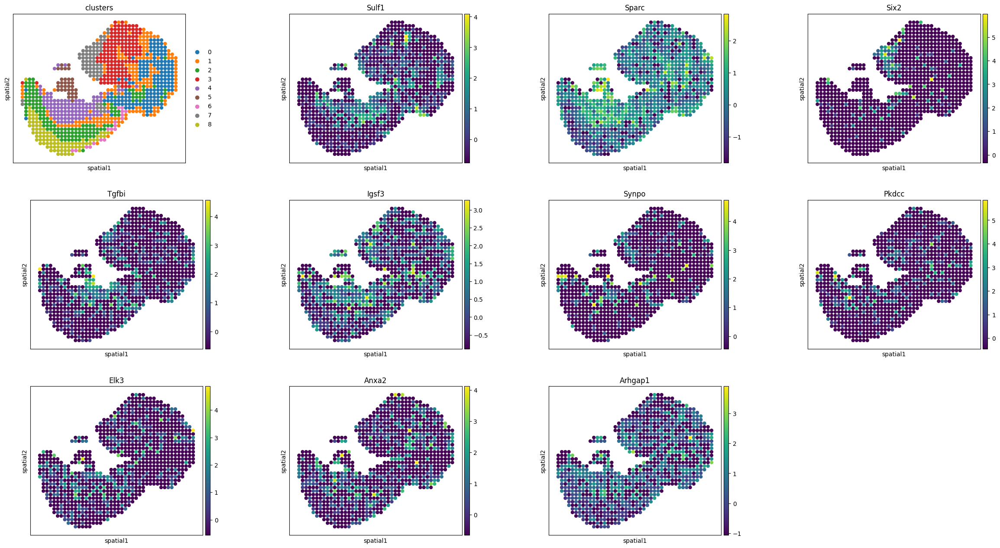

In [ ]:
sc.pl.spatial(adata, spot_size=1, color=["clusters","Sulf1","Sparc","Six2", "Tgfbi","Igsf3","Synpo","Pkdcc","Elk3","Anxa2","Arhgap1"])

In [ ]:
# hyper2 gene list
genes_of_interest_hyper2 = ['Six2', 'Col3a1', 'Hba-a2', 'Hbb-y', 'Hba-a1', 'Hba-x', 'Hbb-bh1', 'Glra1', 'Fbn2', 'Cnn2']
# Calculate Moran's I for these genes
sq.gr.spatial_autocorr(adata, mode='moran', genes=genes_of_interest_hyper2)

In [ ]:
adata.uns["moranI"].head(10)

,I,pval_norm,var_norm,pval_norm_fdr_bh
Hbb-y,0.543401,0.0,0.000321,0.0
Hba-x,0.529156,0.0,0.000321,0.0
Hbb-bh1,0.525283,0.0,0.000321,0.0
Hba-a2,0.511087,0.0,0.000321,0.0
Hba-a1,0.511074,0.0,0.000321,0.0
Col3a1,0.447410,0.0,0.000321,0.0
Glra1,0.441687,0.0,0.000321,0.0
Fbn2,0.431344,0.0,0.000321,0.0
Cnn2,0.300618,0.0,0.000321,0.0
Six2,0.213173,0.0,0.000321,0.0


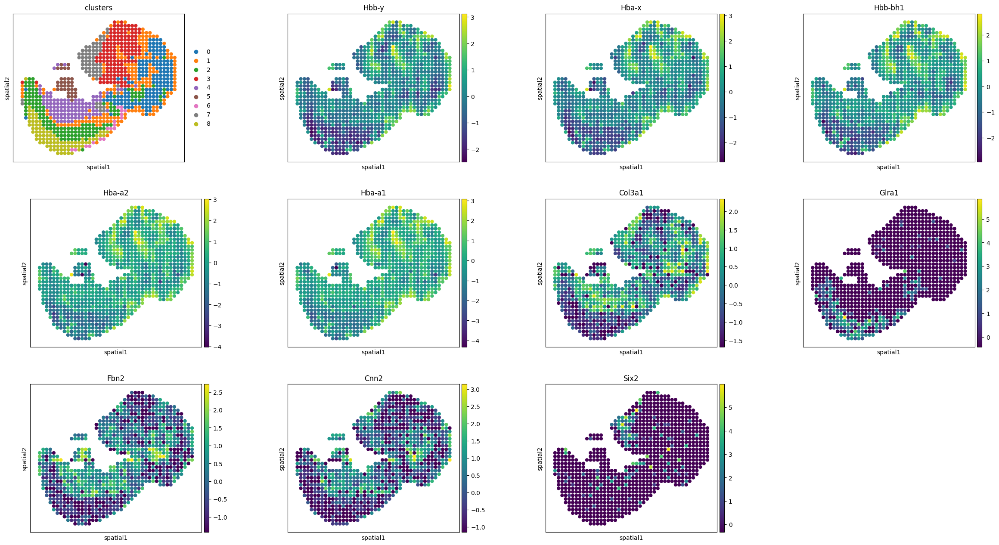

In [ ]:
sc.pl.spatial(adata, spot_size=1, color=["clusters","Hbb-y","Hba-x","Hbb-bh1", "Hba-a2","Hba-a1","Col3a1","Glra1","Fbn2","Cnn2","Six2"])

In [ ]:
# hyper3 model gene list
genes_of_interest_hyper3 = ['Six2', 'Tagln', 'Sparc', 'Tgfbi', 'Col26a1', 'Foxp2', 'Foxc1', 'Vcan', 'Cxcl12', 'Col1a2']

# Calculate Moran's I for these genes
sq.gr.spatial_autocorr(adata, mode='moran', genes=genes_of_interest_hyper3)

In [ ]:
adata.uns["moranI"].head(10)

,I,pval_norm,var_norm,pval_norm_fdr_bh
Vcan,0.426047,0.0,0.000321,0.0
Tagln,0.306436,0.0,0.000321,0.0
Col1a2,0.257242,0.0,0.000321,0.0
Sparc,0.247551,0.0,0.000321,0.0
Cxcl12,0.239783,0.0,0.000321,0.0
Foxp2,0.215571,0.0,0.000321,0.0
Six2,0.213173,0.0,0.000321,0.0
Tgfbi,0.188715,0.0,0.000321,0.0
Col26a1,0.166905,0.0,0.000321,0.0
Foxc1,0.155657,0.0,0.000321,0.0


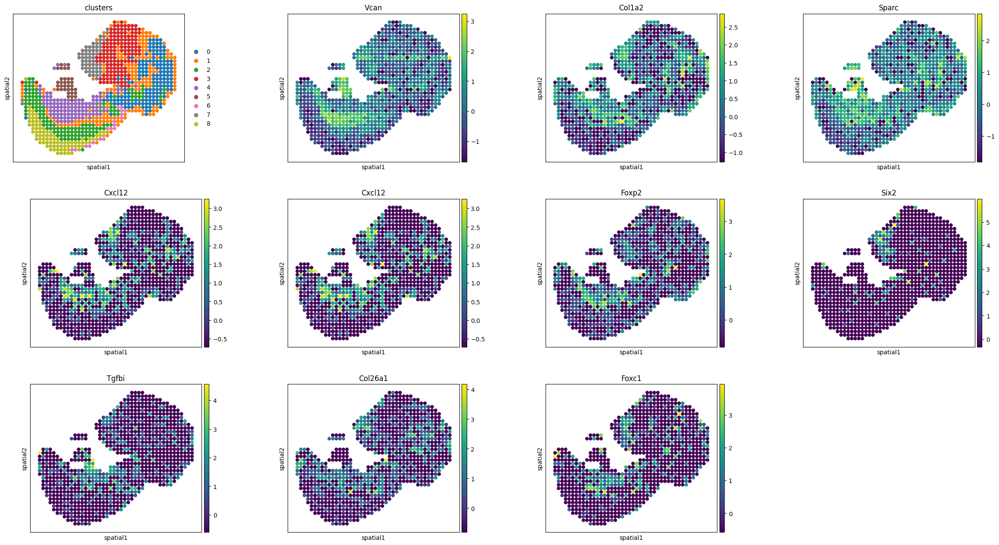

In [ ]:
sc.pl.spatial(adata, spot_size=1, color=["clusters","Vcan","Col1a2","Sparc", "Cxcl12","Cxcl12","Foxp2","Six2","Tgfbi","Col26a1","Foxc1"])

## co-location analysis

In [ ]:
# example model

# Define a threshold for considering a gene "expressed"
expression_threshold = 1

# Binarize gene expression data based on the threshold
binary_gene_expression = (adata[:, genes_of_interest_example].X.toarray() > expression_threshold).astype(int)

# Calculate observed co-location for each pair of genes
observed_co_location = np.dot(binary_gene_expression.T, binary_gene_expression)

# Convert to DataFrame for easier handling
observed_co_location_df = pd.DataFrame(observed_co_location, index=genes_of_interest_example, columns=genes_of_interest_example)

print("Observed Co-location Matrix:")
print(observed_co_location_df)

Observed Co-location Matrix:
        Six2  Col3a1  Col1a2  Vcan  Gpc3  Lgals1  Fbn2  Rbp1  Col4a1  Cxcl12
Six2      93      21      25    23    25      15    11    15      21      35
Col3a1    21     165      91    59    69      82    72    37      72      64
Col1a2    25      91     167    56    67      79    63    39      72      70
Vcan      23      59      56   152    65      56    66    36      49      57
Gpc3      25      69      67    65   167      57    68    40      51      71
Lgals1    15      82      79    56    57     170    67    33      58      56
Fbn2      11      72      63    66    68      67   161    34      60      57
Rbp1      15      37      39    36    40      33    34   171      24      47
Col4a1    21      72      72    49    51      58    60    24     157      55
Cxcl12    35      64      70    57    71      56    57    47      55     178


In [ ]:
n_permutations = 1000
perm_co_location = np.zeros_like(observed_co_location, dtype=float)  # Initialize as float array

for i in range(n_permutations):
    # Permute gene expression for each gene independently
    permuted_expression = np.apply_along_axis(np.random.permutation, axis=0, arr=binary_gene_expression)

    # Calculate co-location for the permuted data
    perm_co_location += np.dot(permuted_expression.T, permuted_expression)

# Average across all permutations
perm_co_location /= n_permutations  # This will now work because perm_co_location is a float array
perm_co_location_df = pd.DataFrame(perm_co_location, index=genes_of_interest_example, columns=genes_of_interest_example)

print("Permuted Co-location Matrix:")
print(perm_co_location_df)

Permuted Co-location Matrix:
          Six2   Col3a1   Col1a2     Vcan     Gpc3   Lgals1     Fbn2     Rbp1  \
Six2    93.000   16.550   16.513   15.096   16.718   16.997   15.785   16.785   
Col3a1  16.550  165.000   29.475   26.539   29.251   29.693   28.229   30.059   
Col1a2  16.513   29.475  167.000   26.943   29.597   30.259   28.768   30.686   
Vcan    15.096   26.539   26.943  152.000   27.070   27.302   26.493   28.029   
Gpc3    16.718   29.251   29.597   27.070  167.000   30.395   28.681   30.495   
Lgals1  16.997   29.693   30.259   27.302   30.395  170.000   29.131   30.744   
Fbn2    15.785   28.229   28.768   26.493   28.681   29.131  161.000   29.492   
Rbp1    16.785   30.059   30.686   28.029   30.495   30.744   29.492  171.000   
Col4a1  15.625   27.612   27.895   25.592   27.837   28.652   27.093   28.859   
Cxcl12  17.837   31.418   31.743   28.940   31.534   32.380   30.413   32.750   

         Col4a1   Cxcl12  
Six2     15.625   17.837  
Col3a1   27.612   31.418 

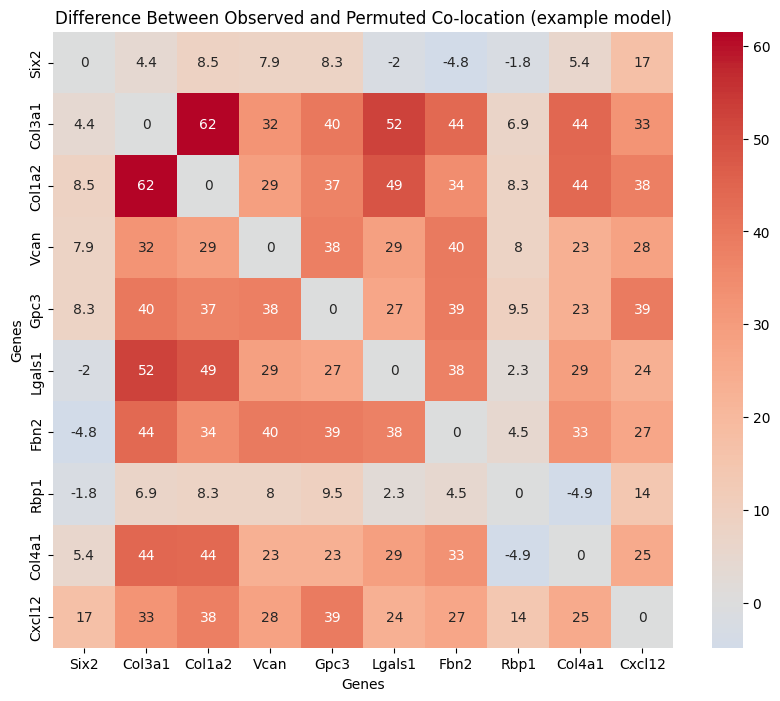

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the difference between observed and permuted co-location
diff_co_location_df = observed_co_location_df - perm_co_location_df

# Create a heatmap to visualize the difference
plt.figure(figsize=(10, 8))
sns.heatmap(diff_co_location_df, annot=True, cmap="coolwarm", center=0)
plt.title("Difference Between Observed and Permuted Co-location (example model)")
plt.xlabel("Genes")
plt.ylabel("Genes")
plt.show()

Observed Co-location Matrix:
         Six2  Sulf1  Igsf3  Arhgap1  Synpo  Tgfbi  Sparc  Pkdcc  Anxa2  Elk3
Six2       93     19     23       21     25     23     11     19     16    19
Sulf1      19    166     42       54     29     40     45     34     37    46
Igsf3      23     42    163       28     33     40     35     29     38    37
Arhgap1    21     54     28      169     35     40     36     37     38    41
Synpo      25     29     33       35    135     38     28     36     30    33
Tgfbi      23     40     40       40     38    157     39     28     48    47
Sparc      11     45     35       36     28     39    139     33     47    45
Pkdcc      19     34     29       37     36     28     33    139     42    34
Anxa2      16     37     38       38     30     48     47     42    154    37
Elk3       19     46     37       41     33     47     45     34     37   159
Permuted Co-location Matrix:
           Six2    Sulf1    Igsf3  Arhgap1    Synpo    Tgfbi    Sparc  \
Six2     93

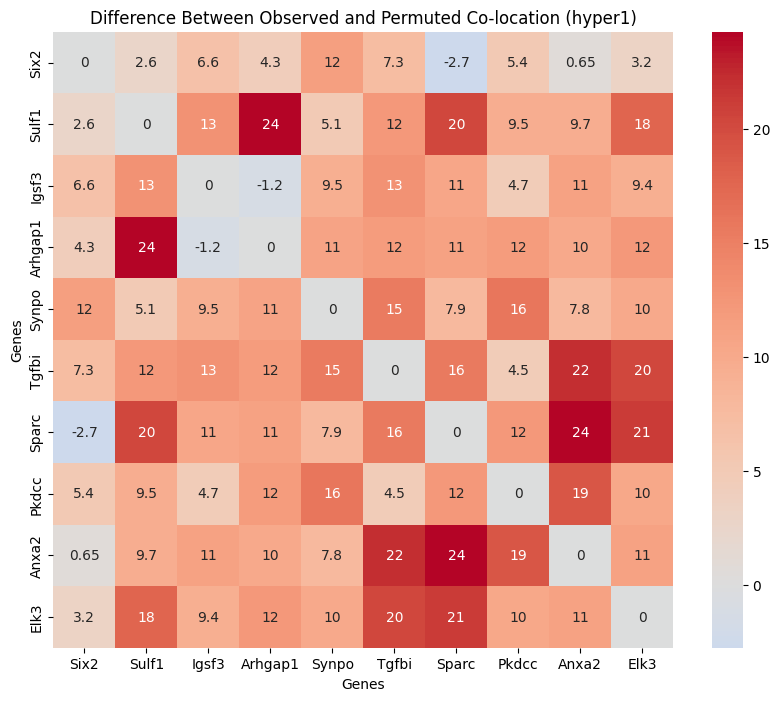

In [ ]:
# hyper1 model

# Define a threshold for considering a gene "expressed"
expression_threshold = 1

# Binarize gene expression data based on the threshold
binary_gene_expression = (adata[:, genes_of_interest_hyper1].X.toarray() > expression_threshold).astype(int)

# Calculate observed co-location for each pair of genes
observed_co_location = np.dot(binary_gene_expression.T, binary_gene_expression)

# Convert to DataFrame for easier handling
observed_co_location_df = pd.DataFrame(observed_co_location, index=genes_of_interest_hyper1, columns=genes_of_interest_hyper1)

print("Observed Co-location Matrix:")
print(observed_co_location_df)

n_permutations = 1000
perm_co_location = np.zeros_like(observed_co_location, dtype=float)  # Initialize as float array

for i in range(n_permutations):
    # Permute gene expression for each gene independently
    permuted_expression = np.apply_along_axis(np.random.permutation, axis=0, arr=binary_gene_expression)

    # Calculate co-location for the permuted data
    perm_co_location += np.dot(permuted_expression.T, permuted_expression)

# Average across all permutations
perm_co_location /= n_permutations  # This will now work because perm_co_location is a float array
perm_co_location_df = pd.DataFrame(perm_co_location, index=genes_of_interest_hyper1, columns=genes_of_interest_hyper1)

print("Permuted Co-location Matrix:")
print(perm_co_location_df)

import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the difference between observed and permuted co-location
diff_co_location_df = observed_co_location_df - perm_co_location_df

# Create a heatmap to visualize the difference
plt.figure(figsize=(10, 8))
sns.heatmap(diff_co_location_df, annot=True, cmap="coolwarm", center=0)
plt.title("Difference Between Observed and Permuted Co-location (hyper1)")
plt.xlabel("Genes")
plt.ylabel("Genes")
plt.show()

Observed Co-location Matrix:
         Six2  Col3a1  Hba-a2  Hbb-y  Hba-a1  Hba-x  Hbb-bh1  Glra1  Fbn2  \
Six2       93      21      26     25      23     22       22      8    11   
Col3a1     21     165      49     47      47     46       51      3    72   
Hba-a2     26      49     151    126     138    125      128      6    29   
Hbb-y      25      47     126    149     124    123      125      8    31   
Hba-a1     23      47     138    124     145    123      127      8    27   
Hba-x      22      46     125    123     123    144      126      8    30   
Hbb-bh1    22      51     128    125     127    126      149      9    33   
Glra1       8       3       6      8       8      8        9    141     6   
Fbn2       11      72      29     31      27     30       33      6   161   
Cnn2       22      71      44     45      42     37       41      2    67   

         Cnn2  
Six2       22  
Col3a1     71  
Hba-a2     44  
Hbb-y      45  
Hba-a1     42  
Hba-x      37  
Hbb-bh1    

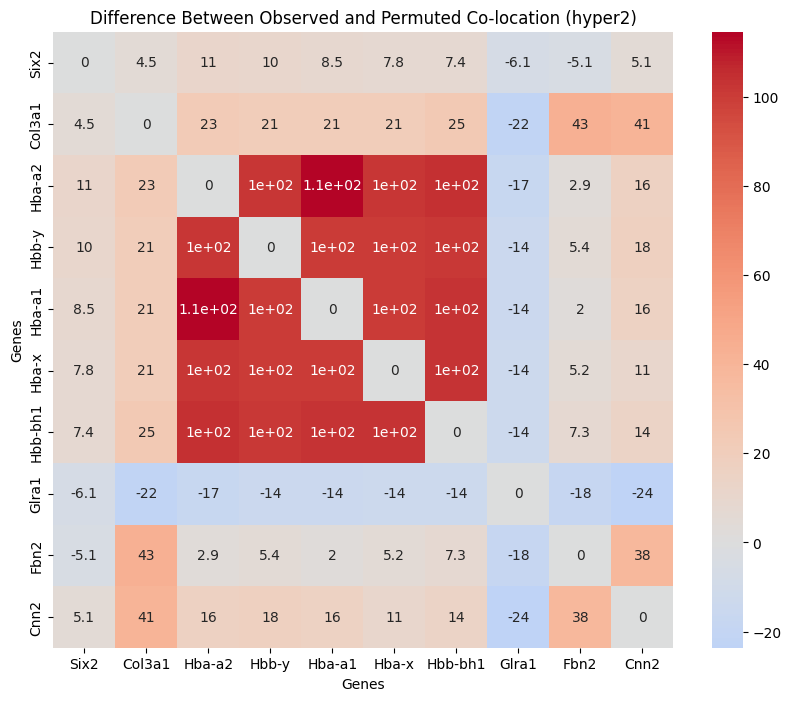

In [ ]:
# hyper2 model

# Define a threshold for considering a gene "expressed"
expression_threshold = 1

# Binarize gene expression data based on the threshold
binary_gene_expression = (adata[:, genes_of_interest_hyper2].X.toarray() > expression_threshold).astype(int)

# Calculate observed co-location for each pair of genes
observed_co_location = np.dot(binary_gene_expression.T, binary_gene_expression)

# Convert to DataFrame for easier handling
observed_co_location_df = pd.DataFrame(observed_co_location, index=genes_of_interest_hyper2, columns=genes_of_interest_hyper2)

print("Observed Co-location Matrix:")
print(observed_co_location_df)

n_permutations = 1000
perm_co_location = np.zeros_like(observed_co_location, dtype=float)  # Initialize as float array

for i in range(n_permutations):
    # Permute gene expression for each gene independently
    permuted_expression = np.apply_along_axis(np.random.permutation, axis=0, arr=binary_gene_expression)

    # Calculate co-location for the permuted data
    perm_co_location += np.dot(permuted_expression.T, permuted_expression)

# Average across all permutations
perm_co_location /= n_permutations  # This will now work because perm_co_location is a float array
perm_co_location_df = pd.DataFrame(perm_co_location, index=genes_of_interest_hyper2, columns=genes_of_interest_hyper2)

print("Permuted Co-location Matrix:")
print(perm_co_location_df)

import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the difference between observed and permuted co-location
diff_co_location_df = observed_co_location_df - perm_co_location_df

# Create a heatmap to visualize the difference
plt.figure(figsize=(10, 8))
sns.heatmap(diff_co_location_df, annot=True, cmap="coolwarm", center=0)
plt.title("Difference Between Observed and Permuted Co-location (hyper2)")
plt.xlabel("Genes")
plt.ylabel("Genes")
plt.show()

Observed Co-location Matrix:
         Six2  Tagln  Sparc  Tgfbi  Col26a1  Foxp2  Foxc1  Vcan  Cxcl12  \
Six2       93     19     11     23       28     23     29    23      35   
Tagln      19    130     56     44       31     38     40    36      52   
Sparc      11     56    139     39       48     44     41    61      58   
Tgfbi      23     44     39    157       43     44     61    42      50   
Col26a1    28     31     48     43      163     50     53    48      63   
Foxp2      23     38     44     44       50    162     58    56      57   
Foxc1      29     40     41     61       53     58    158    49      64   
Vcan       23     36     61     42       48     56     49   152      57   
Cxcl12     35     52     58     50       63     57     64    57     178   
Col1a2     25     47     57     49       62     58     57    56      70   

         Col1a2  
Six2         25  
Tagln        47  
Sparc        57  
Tgfbi        49  
Col26a1      62  
Foxp2        58  
Foxc1        57  
V

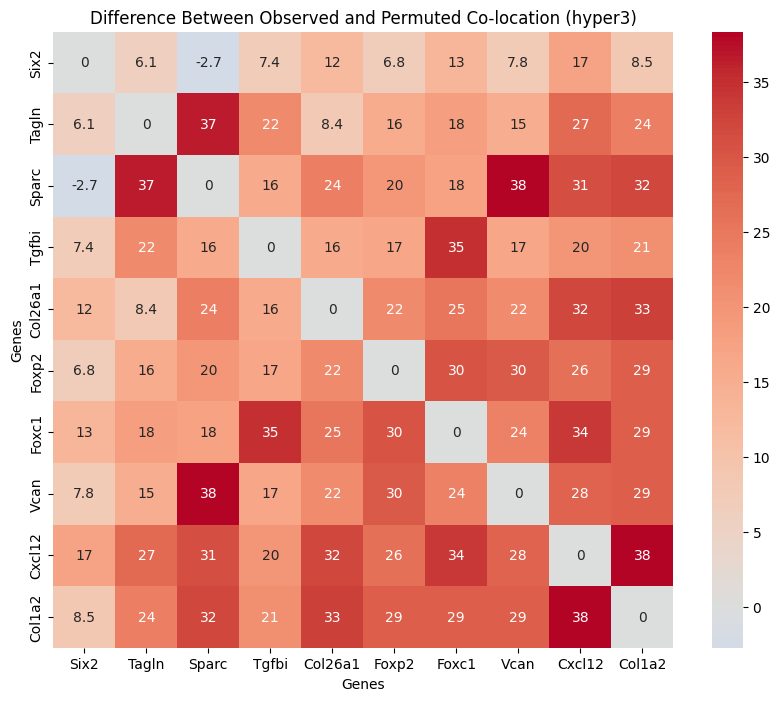

In [ ]:
# hyper3 model

# Define a threshold for considering a gene "expressed"
expression_threshold = 1

# Binarize gene expression data based on the threshold
binary_gene_expression = (adata[:, genes_of_interest_hyper3].X.toarray() > expression_threshold).astype(int)

# Calculate observed co-location for each pair of genes
observed_co_location = np.dot(binary_gene_expression.T, binary_gene_expression)

# Convert to DataFrame for easier handling
observed_co_location_df = pd.DataFrame(observed_co_location, index=genes_of_interest_hyper3, columns=genes_of_interest_hyper3)

print("Observed Co-location Matrix:")
print(observed_co_location_df)

n_permutations = 1000
perm_co_location = np.zeros_like(observed_co_location, dtype=float)  # Initialize as float array

for i in range(n_permutations):
    # Permute gene expression for each gene independently
    permuted_expression = np.apply_along_axis(np.random.permutation, axis=0, arr=binary_gene_expression)

    # Calculate co-location for the permuted data
    perm_co_location += np.dot(permuted_expression.T, permuted_expression)

# Average across all permutations
perm_co_location /= n_permutations  # This will now work because perm_co_location is a float array
perm_co_location_df = pd.DataFrame(perm_co_location, index=genes_of_interest_hyper3, columns=genes_of_interest_hyper3)

print("Permuted Co-location Matrix:")
print(perm_co_location_df)


# Calculate the difference between observed and permuted co-location
diff_co_location_df = observed_co_location_df - perm_co_location_df

# Create a heatmap to visualize the difference
plt.figure(figsize=(10, 8))
sns.heatmap(diff_co_location_df, annot=True, cmap="coolwarm", center=0)
plt.title("Difference Between Observed and Permuted Co-location (hyper3)")
plt.xlabel("Genes")
plt.ylabel("Genes")
plt.show()

## Pearson correlation analysis

In [ ]:
adata

AnnData object with n_obs × n_vars = 936 × 568
    obs: 'id', 'array_row', 'array_col', 'cell_type', 'batch', 'imagecol', 'imagerow', 'label', 'sample', 'predict_sub', 'predict_sub_less', 'clusters'
    var: 'gene_ids-0', 'gene_ids-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'hvg', 'neighbors', 'umap', 'clusters', 'clusters_colors', 'dendrogram_clusters', 'spatial_neighbors', 'moranI'
    obsm: 'spatial', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'scaled'
    obsp: 'distances', 'connectivities', 'spatial_connectivities', 'spatial_distances'

In [ ]:
# Extract the spatial coordinates
spatial_coords = adata.obsm['spatial']

# Extract gene expression data for the genes of interest
gene_expression = adata[:, genes_of_interest_example].X.toarray()  # Convert to dense array for easier handling

# Calculate Pearson correlation for the gene expression matrix
gene_corr = np.corrcoef(gene_expression.T)  # Transpose so that genes are on the rows

# Convert to a DataFrame for easier handling
gene_corr_df = pd.DataFrame(gene_corr, index=genes_of_interest_example, columns=genes_of_interest_example)

# Display the correlation matrix
print(gene_corr_df)

            Six2    Col3a1    Col1a2      Vcan      Gpc3    Lgals1      Fbn2  \
Six2    1.000000  0.167899  0.124132  0.075424  0.084623  0.018656  0.059263   
Col3a1  0.167899  1.000000  0.488955  0.348245  0.329805  0.457113  0.474776   
Col1a2  0.124132  0.488955  1.000000  0.251399  0.340262  0.348423  0.374285   
Vcan    0.075424  0.348245  0.251399  1.000000  0.296408  0.263407  0.352737   
Gpc3    0.084623  0.329805  0.340262  0.296408  1.000000  0.201132  0.369261   
Lgals1  0.018656  0.457113  0.348423  0.263407  0.201132  1.000000  0.301449   
Fbn2    0.059263  0.474776  0.374285  0.352737  0.369261  0.301449  1.000000   
Rbp1    0.011372 -0.008245  0.037681  0.022140  0.102912 -0.027789 -0.028989   
Col4a1  0.072968  0.438787  0.444978  0.212147  0.182356  0.288666  0.347127   
Cxcl12  0.166044  0.325120  0.322647  0.218779  0.265784  0.201881  0.270798   

            Rbp1    Col4a1    Cxcl12  
Six2    0.011372  0.072968  0.166044  
Col3a1 -0.008245  0.438787  0.325120  
Co

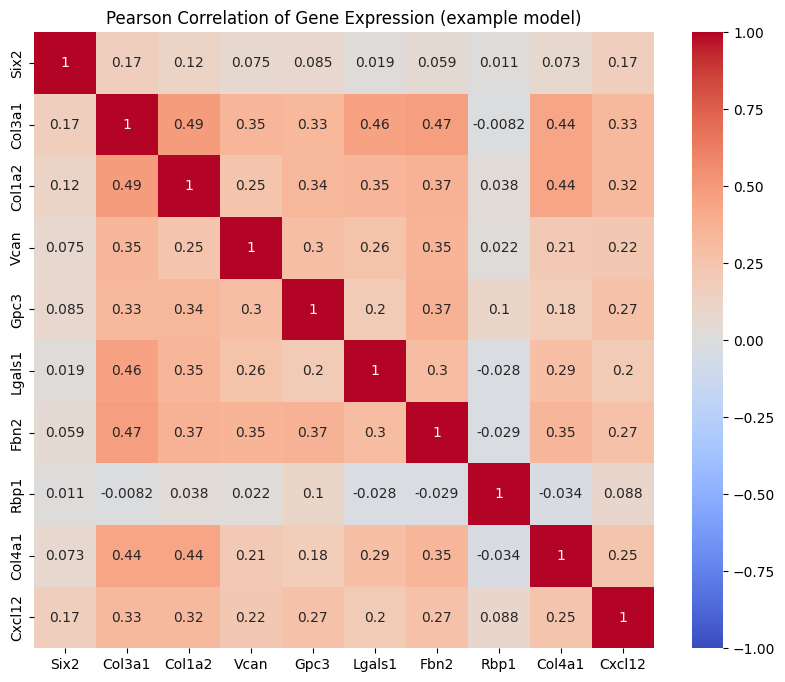

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(gene_corr_df, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Pearson Correlation of Gene Expression (example model)")
plt.show()

             Six2     Sulf1     Igsf3   Arhgap1     Synpo     Tgfbi     Sparc  \
Six2     1.000000  0.049646  0.098257  0.071577  0.115809  0.072430  0.006491   
Sulf1    0.049646  1.000000  0.104644  0.084706  0.096562  0.093975  0.154305   
Igsf3    0.098257  0.104644  1.000000  0.018821  0.104127  0.092198  0.153198   
Arhgap1  0.071577  0.084706  0.018821  1.000000  0.093234  0.068172  0.068329   
Synpo    0.115809  0.096562  0.104127  0.093234  1.000000  0.087405  0.141221   
Tgfbi    0.072430  0.093975  0.092198  0.068172  0.087405  1.000000  0.153354   
Sparc    0.006491  0.154305  0.153198  0.068329  0.141221  0.153354  1.000000   
Pkdcc    0.026481  0.096814  0.043367  0.104508  0.127890  0.016957  0.130423   
Anxa2   -0.002752  0.018402  0.079104  0.044931  0.046549  0.131034  0.171592   
Elk3    -0.011539  0.150854  0.051090  0.111745  0.073966  0.120189  0.156831   

            Pkdcc     Anxa2      Elk3  
Six2     0.026481 -0.002752 -0.011539  
Sulf1    0.096814  0.018402 

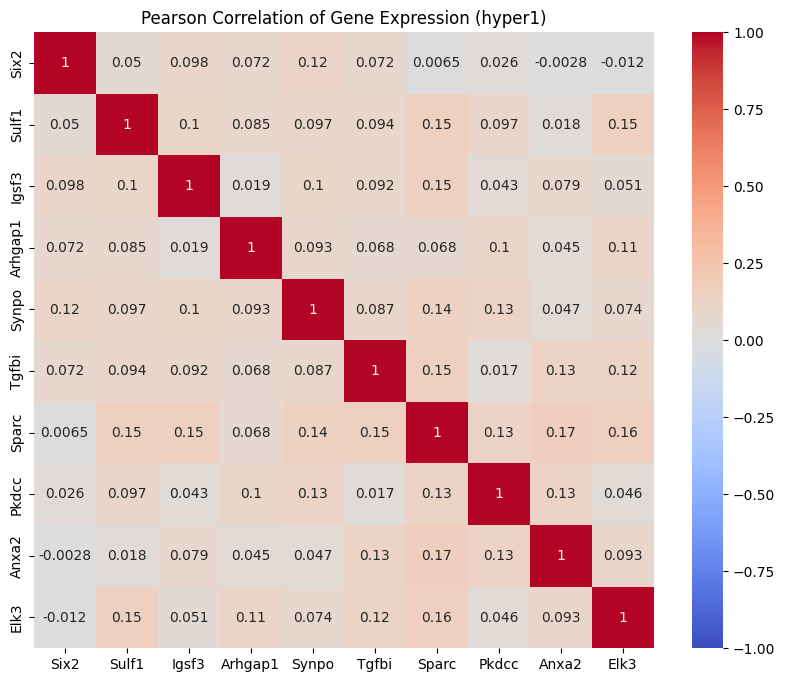

In [ ]:
# Extract the spatial coordinates
spatial_coords = adata.obsm['spatial']

# Extract gene expression data for the genes of interest
gene_expression = adata[:, genes_of_interest_hyper1].X.toarray()

# Calculate Pearson correlation for the gene expression matrix
gene_corr_1 = np.corrcoef(gene_expression.T)

# Convert to a DataFrame for easier handling
gene_corr_df_1 = pd.DataFrame(gene_corr_1, index=genes_of_interest_hyper1, columns=genes_of_interest_hyper1)

# Display the correlation matrix
print(gene_corr_df_1)

# Plot a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(gene_corr_df_1, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Pearson Correlation of Gene Expression (hyper1)")
plt.show()

             Six2    Col3a1    Hba-a2     Hbb-y    Hba-a1     Hba-x   Hbb-bh1  \
Six2     1.000000  0.167899  0.136756  0.143435  0.135169  0.137561  0.130551   
Col3a1   0.167899  1.000000  0.433614  0.440610  0.417310  0.415455  0.421710   
Hba-a2   0.136756  0.433614  1.000000  0.914559  0.928320  0.905488  0.885710   
Hbb-y    0.143435  0.440610  0.914559  1.000000  0.921455  0.933200  0.929044   
Hba-a1   0.135169  0.417310  0.928320  0.921455  1.000000  0.912842  0.884452   
Hba-x    0.137561  0.415455  0.905488  0.933200  0.912842  1.000000  0.899435   
Hbb-bh1  0.130551  0.421710  0.885710  0.929044  0.884452  0.899435  1.000000   
Glra1   -0.041932 -0.320981 -0.294116 -0.333487 -0.294698 -0.310532 -0.312493   
Fbn2     0.059263  0.474776  0.221600  0.271900  0.209145  0.217936  0.258849   
Cnn2     0.143377  0.453273  0.264368  0.314937  0.266419  0.276533  0.282050   

            Glra1      Fbn2      Cnn2  
Six2    -0.041932  0.059263  0.143377  
Col3a1  -0.320981  0.474776 

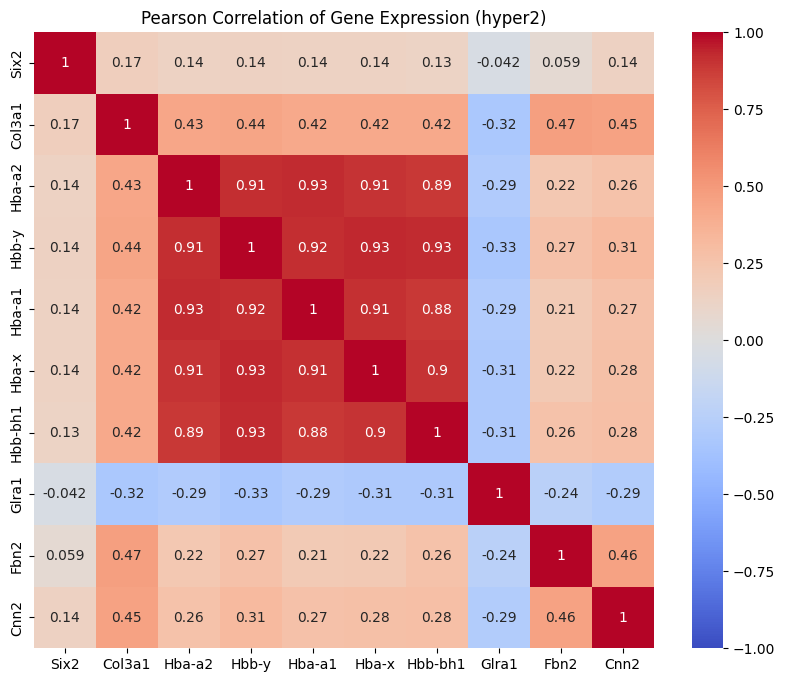

In [ ]:
# Extract the spatial coordinates
spatial_coords = adata.obsm['spatial']

# Extract gene expression data for the genes of interest
gene_expression = adata[:, genes_of_interest_hyper2].X.toarray()

# Calculate Pearson correlation for the gene expression matrix
gene_corr_2 = np.corrcoef(gene_expression.T)

# Convert to a DataFrame for easier handling
gene_corr_df_2 = pd.DataFrame(gene_corr_2, index=genes_of_interest_hyper2, columns=genes_of_interest_hyper2)

# Display the correlation matrix
print(gene_corr_df_2)

import seaborn as sns
import matplotlib.pyplot as plt

# Plot a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(gene_corr_df_2, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Pearson Correlation of Gene Expression (hyper2)")
plt.show()

             Six2     Tagln     Sparc     Tgfbi   Col26a1     Foxp2     Foxc1  \
Six2     1.000000  0.008328  0.006491  0.072430  0.122465  0.134201  0.151504   
Tagln    0.008328  1.000000  0.323598  0.187506  0.065213  0.086699  0.108711   
Sparc    0.006491  0.323598  1.000000  0.153354  0.162306  0.142361  0.143153   
Tgfbi    0.072430  0.187506  0.153354  1.000000  0.130032  0.097843  0.186212   
Col26a1  0.122465  0.065213  0.162306  0.130032  1.000000  0.128185  0.226805   
Foxp2    0.134201  0.086699  0.142361  0.097843  0.128185  1.000000  0.257290   
Foxc1    0.151504  0.108711  0.143153  0.186212  0.226805  0.257290  1.000000   
Vcan     0.075424  0.134320  0.298815  0.182870  0.152973  0.189561  0.183247   
Cxcl12   0.166044  0.189051  0.241232  0.145642  0.230199  0.202300  0.239494   
Col1a2   0.124132  0.227136  0.316875  0.187434  0.252663  0.245895  0.259572   

             Vcan    Cxcl12    Col1a2  
Six2     0.075424  0.166044  0.124132  
Tagln    0.134320  0.189051 

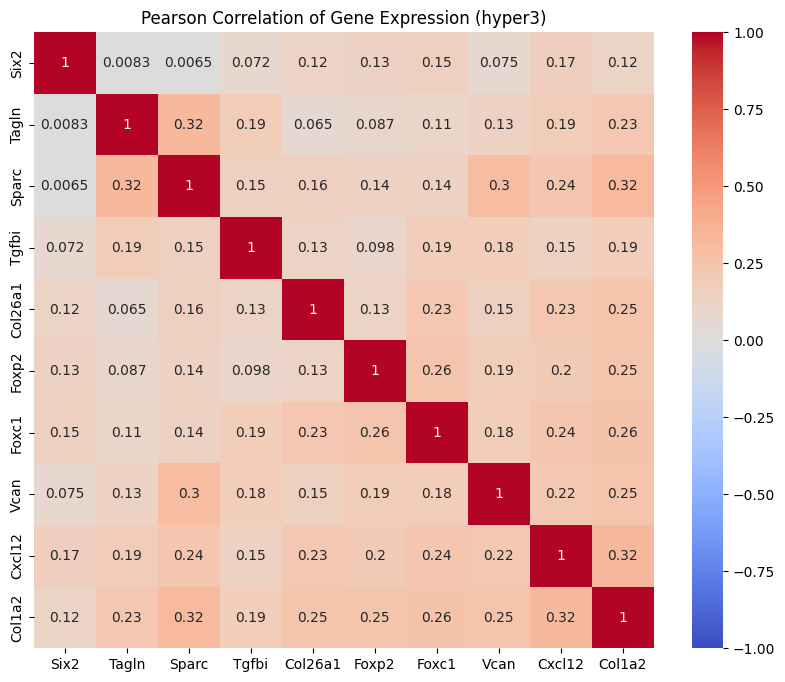

In [ ]:
# Extract the spatial coordinates
spatial_coords = adata.obsm['spatial']

# Extract gene expression data for the genes of interest
gene_expression = adata[:, genes_of_interest_hyper3].X.toarray()

# Calculate Pearson correlation for the gene expression matrix
gene_corr_3 = np.corrcoef(gene_expression.T)

# Convert to a DataFrame for easier handling
gene_corr_df_3 = pd.DataFrame(gene_corr_3, index=genes_of_interest_hyper3, columns=genes_of_interest_hyper3)

# Display the correlation matrix
print(gene_corr_df_3)


# Plot a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(gene_corr_df_3, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Pearson Correlation of Gene Expression (hyper3)")
plt.show()

# Pearson correlation analysis with niche modality in DBiT-seq analysis

In [ ]:
!pip install squidpy
!pip install scanpy

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.8/87.8 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of dask-expr to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of s3fs to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of s3fs to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.3/49.3 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.3/148.3 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.0/129.0 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.5/59.5 kB 3.1 MB/s eta 0:00:00
   

In [ ]:
import numpy as np
import pandas as pd

import anndata as ad
import scanpy as sc
import squidpy as sq

sc.logging.print_header()
print(f"squidpy=={sq.__version__}")

/usr/local/lib/python3.10/dist-packages/cudf/utils/_ptxcompiler.py:61: UserWarning: Error getting driver and runtime versions:

stdout:



stderr:

Traceback (most recent call last):
  File "<string>", line 4, in <module>
  File "/usr/local/lib/python3.10/dist-packages/numba/cuda/cudadrv/driver.py", line 295, in __getattr__
    raise CudaSupportError("Error at driver init: \n%s:" %
numba.cuda.cudadrv.error.CudaSupportError: Error at driver init: 

CUDA driver library cannot be found.
If you are sure that a CUDA driver is installed,
try setting environment variable NUMBA_CUDA_DRIVER
with the file path of the CUDA driver shared library.
:


Not patching Numba
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/cudf/utils/gpu_utils.py:62: UserWarning: Failed to dlopen libcuda.so.1
  warnings.warn(str(e))
/usr/local/lib/python3.10/dist-packages/cudf/utils/gpu_utils.py:62: UserWarning: Function "cuInit" not found
  warnings.warn(str(e))


scanpy==1.10.2 anndata==0.10.9 umap==0.5.6 numpy==1.26.4 scipy==1.13.1 pandas==2.1.4 scikit-learn==1.3.2 statsmodels==0.14.2 igraph==0.11.6 pynndescent==0.5.13
squidpy==1.6.0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import anndata as ad

# Load the anndata object
adata = ad.read_h5ad('/content/drive/MyDrive/Colab Notebooks/adatas_all_2.h5ad')

In [ ]:
adata

AnnData object with n_obs × n_vars = 936 × 568
    obs: 'id', 'array_row', 'array_col', 'cell_type', 'batch', 'imagecol', 'imagerow', 'label', 'sample', 'predict_sub', 'predict_sub_less'
    var: 'gene_ids'
    obsm: 'spatial'

In [ ]:
genes_of_interest_example = ['Six2', 'Col3a1', 'Col1a2', 'Vcan', 'Gpc3', 'Lgals1', 'Fbn2', 'Rbp1', 'Col4a1', 'Cxcl12']

In [ ]:
# Extract the spatial coordinates
spatial_coords = adata.obsm['spatial']

# Extract gene expression data for the genes of interest
gene_expression = adata[:, genes_of_interest_example].X.toarray()  # Convert to dense array for easier handling

# Calculate Pearson correlation for the gene expression matrix
gene_corr = np.corrcoef(gene_expression.T)  # Transpose so that genes are on the rows

# Convert to a DataFrame for easier handling
gene_corr_df = pd.DataFrame(gene_corr, index=genes_of_interest_example, columns=genes_of_interest_example)

# Display the correlation matrix
print(gene_corr_df)

            Six2    Col3a1    Col1a2      Vcan      Gpc3    Lgals1      Fbn2  \
Six2    1.000000  0.285646  0.326545  0.212226  0.231653  0.027947  0.227930   
Col3a1  0.285646  1.000000  0.816322  0.545439  0.586969  0.726887  0.729950   
Col1a2  0.326545  0.816322  1.000000  0.526684  0.661942  0.669835  0.658569   
Vcan    0.212226  0.545439  0.526684  1.000000  0.563110  0.532746  0.619835   
Gpc3    0.231653  0.586969  0.661942  0.563110  1.000000  0.519512  0.666340   
Lgals1  0.027947  0.726887  0.669835  0.532746  0.519512  1.000000  0.589423   
Fbn2    0.227930  0.729950  0.658569  0.619835  0.666340  0.589423  1.000000   
Rbp1   -0.011985 -0.052313  0.079645  0.148292  0.254933 -0.009628  0.044557   
Col4a1  0.183596  0.739874  0.667380  0.411145  0.440912  0.575977  0.564414   
Cxcl12  0.396154  0.657554  0.672498  0.519588  0.662377  0.502653  0.593919   

            Rbp1    Col4a1    Cxcl12  
Six2   -0.011985  0.183596  0.396154  
Col3a1 -0.052313  0.739874  0.657554  
Co

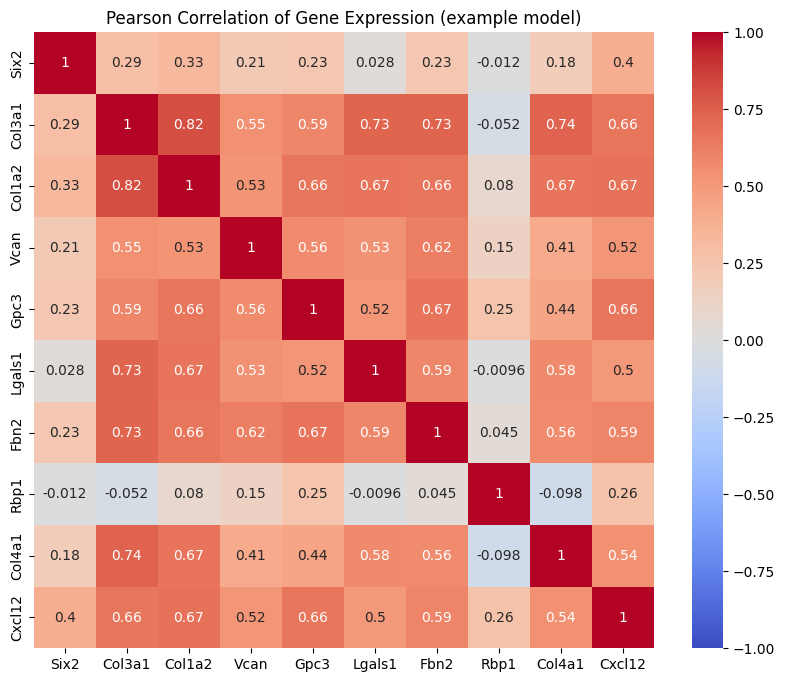

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(gene_corr_df, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Pearson Correlation of Gene Expression (example model)")
plt.show()

In [ ]:
genes_of_interest_hyper1 = ['Six2', 'Sulf1', 'Igsf3', 'Arhgap1', 'Synpo', 'Tgfbi', 'Sparc', 'Pkdcc', 'Anxa2', 'Elk3']

In [ ]:
# Extract the spatial coordinates
spatial_coords = adata.obsm['spatial']

# Extract gene expression data for the genes of interest
gene_expression = adata[:, genes_of_interest_hyper1].X.toarray()  # Convert to dense array for easier handling

# Calculate Pearson correlation for the gene expression matrix
gene_corr = np.corrcoef(gene_expression.T)  # Transpose so that genes are on the rows

# Convert to a DataFrame for easier handling
gene_corr_df = pd.DataFrame(gene_corr, index=genes_of_interest_hyper1, columns=genes_of_interest_hyper1)

# Display the correlation matrix
print(gene_corr_df)

             Six2     Sulf1     Igsf3   Arhgap1     Synpo     Tgfbi     Sparc  \
Six2     1.000000  0.171912  0.345077  0.116187  0.370839  0.233698  0.014981   
Sulf1    0.171912  1.000000  0.372996  0.263106  0.225116  0.366583  0.448215   
Igsf3    0.345077  0.372996  1.000000  0.292963  0.409018  0.460326  0.427916   
Arhgap1  0.116187  0.263106  0.292963  1.000000  0.318041  0.330130  0.396658   
Synpo    0.370839  0.225116  0.409018  0.318041  1.000000  0.508510  0.396405   
Tgfbi    0.233698  0.366583  0.460326  0.330130  0.508510  1.000000  0.502894   
Sparc    0.014981  0.448215  0.427916  0.396658  0.396405  0.502894  1.000000   
Pkdcc    0.073550  0.271941  0.246109  0.330083  0.361698  0.231314  0.384699   
Anxa2   -0.102048  0.147036  0.194767  0.286625  0.174113  0.291752  0.497435   
Elk3     0.095128  0.313735  0.318940  0.346249  0.371727  0.446779  0.420816   

            Pkdcc     Anxa2      Elk3  
Six2     0.073550 -0.102048  0.095128  
Sulf1    0.271941  0.147036 

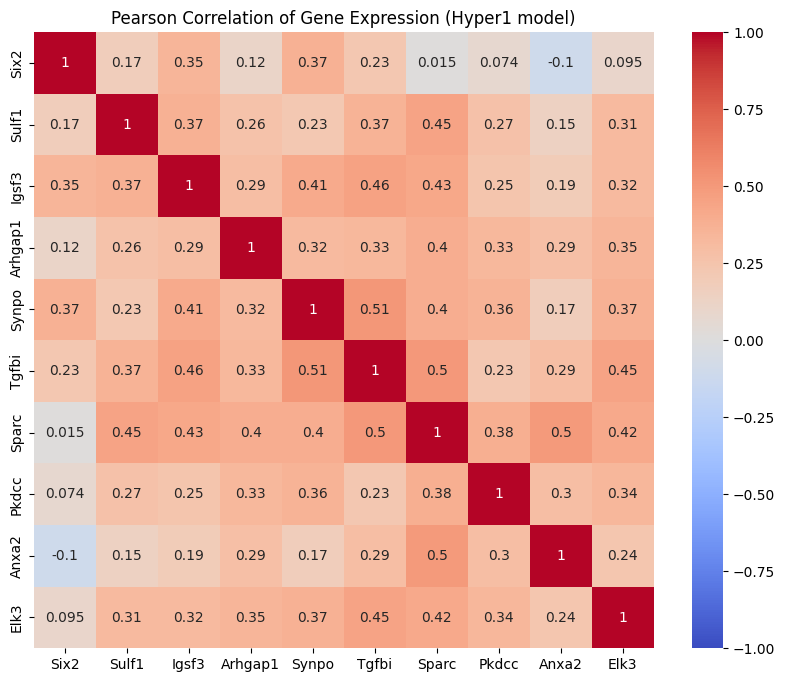

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(gene_corr_df, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Pearson Correlation of Gene Expression (Hyper1 model)")
plt.show()

In [ ]:
genes_of_interest_hyper2 = ['Six2', 'Col3a1', 'Hba-a2', 'Hbb-y', 'Hba-a1', 'Hba-x', 'Hbb-bh1', 'Glra1', 'Fbn2', 'Cnn2']

             Six2    Col3a1    Hba-a2     Hbb-y    Hba-a1     Hba-x   Hbb-bh1  \
Six2     1.000000  0.285646  0.229053  0.218410  0.215564  0.211120  0.224415   
Col3a1   0.285646  1.000000  0.547132  0.567574  0.530578  0.510951  0.547424   
Hba-a2   0.229053  0.547132  1.000000  0.978323  0.984334  0.976975  0.970657   
Hbb-y    0.218410  0.567574  0.978323  1.000000  0.983264  0.977234  0.980563   
Hba-a1   0.215564  0.530578  0.984334  0.983264  1.000000  0.977889  0.972461   
Hba-x    0.211120  0.510951  0.976975  0.977234  0.977889  1.000000  0.968313   
Hbb-bh1  0.224415  0.547424  0.970657  0.980563  0.972461  0.968313  1.000000   
Glra1   -0.202094 -0.635917 -0.567372 -0.581867 -0.550285 -0.550414 -0.567354   
Fbn2     0.227930  0.729950  0.265047  0.319782  0.255947  0.235101  0.301909   
Cnn2     0.285666  0.767096  0.322996  0.367958  0.316067  0.301646  0.346265   

            Glra1      Fbn2      Cnn2  
Six2    -0.202094  0.227930  0.285666  
Col3a1  -0.635917  0.729950 

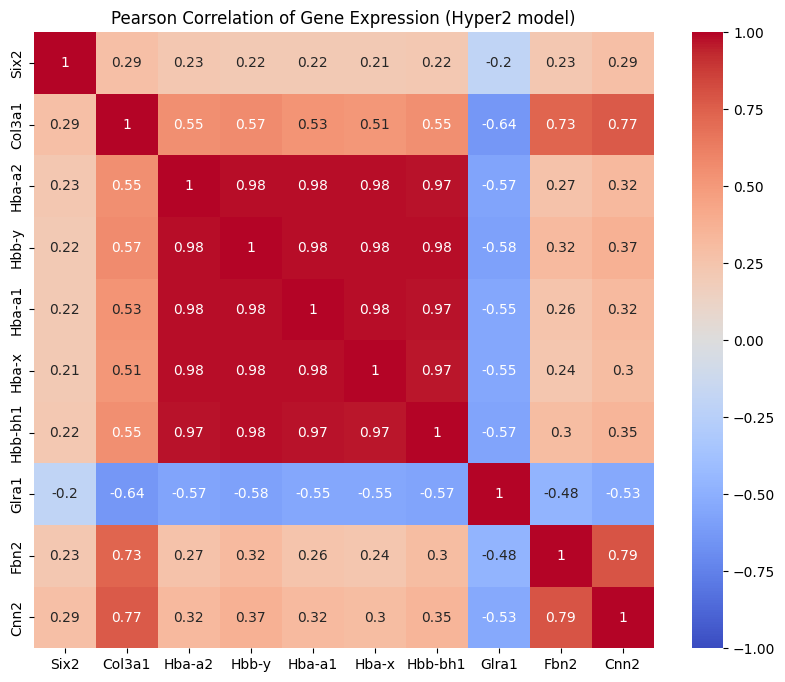

In [ ]:
# Extract the spatial coordinates
spatial_coords = adata.obsm['spatial']

# Extract gene expression data for the genes of interest
gene_expression = adata[:, genes_of_interest_hyper2].X.toarray()  # Convert to dense array for easier handling

# Calculate Pearson correlation for the gene expression matrix
gene_corr = np.corrcoef(gene_expression.T)  # Transpose so that genes are on the rows

# Convert to a DataFrame for easier handling
gene_corr_df = pd.DataFrame(gene_corr, index=genes_of_interest_hyper2, columns=genes_of_interest_hyper2)

# Display the correlation matrix
print(gene_corr_df)

# Plot a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(gene_corr_df, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Pearson Correlation of Gene Expression (Hyper2 model)")
plt.show()

In [ ]:
genes_of_interest_hyper3 = ['Six2', 'Tagln', 'Sparc', 'Tgfbi', 'Col26a1', 'Foxp2', 'Foxc1', 'Vcan', 'Cxcl12', 'Col1a2']

             Six2     Tagln     Sparc     Tgfbi   Col26a1     Foxp2     Foxc1  \
Six2     1.000000 -0.054301  0.014981  0.233698  0.421488  0.246158  0.455331   
Tagln   -0.054301  1.000000  0.690791  0.525167  0.219363  0.314752  0.303568   
Sparc    0.014981  0.690791  1.000000  0.502894  0.386978  0.441471  0.422168   
Tgfbi    0.233698  0.525167  0.502894  1.000000  0.395748  0.347525  0.468799   
Col26a1  0.421488  0.219363  0.386978  0.395748  1.000000  0.439693  0.553257   
Foxp2    0.246158  0.314752  0.441471  0.347525  0.439693  1.000000  0.666796   
Foxc1    0.455331  0.303568  0.422168  0.468799  0.553257  0.666796  1.000000   
Vcan     0.212226  0.379223  0.598226  0.454396  0.370657  0.434072  0.509357   
Cxcl12   0.396154  0.432542  0.534815  0.472989  0.601203  0.559485  0.628628   
Col1a2   0.326545  0.459580  0.621192  0.493275  0.657825  0.526393  0.586227   

             Vcan    Cxcl12    Col1a2  
Six2     0.212226  0.396154  0.326545  
Tagln    0.379223  0.432542 

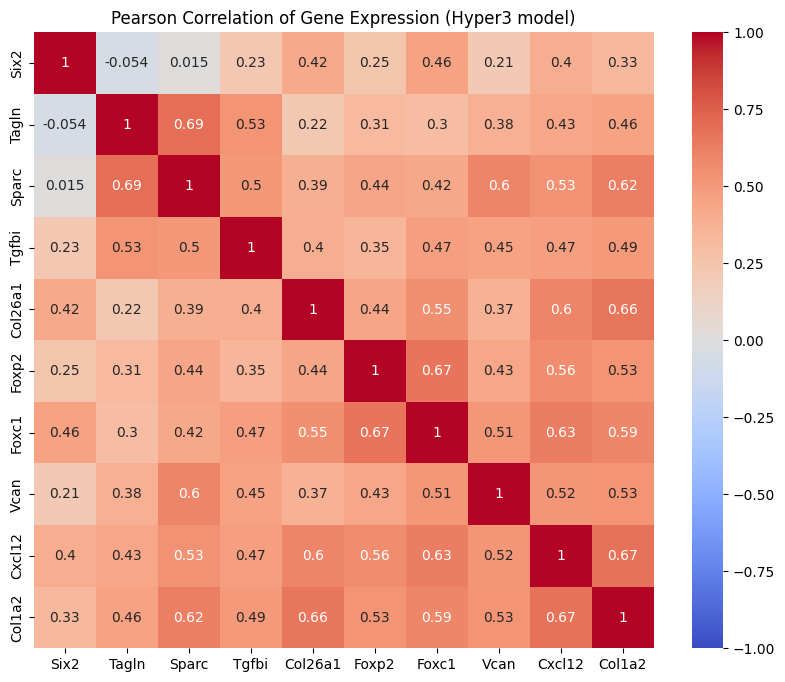

In [ ]:
# Extract the spatial coordinates
spatial_coords = adata.obsm['spatial']

# Extract gene expression data for the genes of interest
gene_expression = adata[:, genes_of_interest_hyper3].X.toarray()  # Convert to dense array for easier handling

# Calculate Pearson correlation for the gene expression matrix
gene_corr = np.corrcoef(gene_expression.T)  # Transpose so that genes are on the rows

# Convert to a DataFrame for easier handling
gene_corr_df = pd.DataFrame(gene_corr, index=genes_of_interest_hyper3, columns=genes_of_interest_hyper3)

# Display the correlation matrix
print(gene_corr_df)

# Plot a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(gene_corr_df, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Pearson Correlation of Gene Expression (Hyper3 model)")
plt.show()